# Face Recognition

### !!This is a basic notebook, completing which you can get (preliminarly) 5/10 ponints. Other tasks which will get you more ponts are described in a Telegram chat

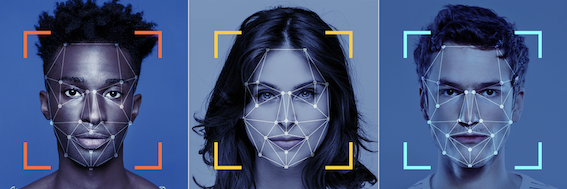

In this project you'll dive into face recognition framework and train neural network for face recognition task, play with losses and metrics.

We will train neural network on [CelebA dataset](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). 

As you see on the site, images of celebA dataset look like this:


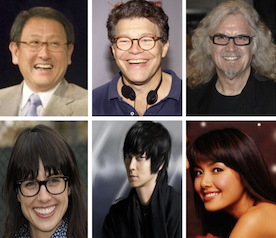

But we won't train a neural network for face recognition on those images. We'll need to preprocess them first. Let's see why we need it and how we need to preprocess them.

Let's look at how face recognition systems work:

## Face recognition model training and inference setup

This section describes how face recognition models are trained, what data alignment is and how the inference of face recognition model looks like. If you are familiar with this, you can skip this section.

### Model training

To train face recognition model on any facial dataset images must be aligned first. This step is very important to achieve a good quality of face recognition.

What is alignment: it consists of three steps:
1. Given image, identify facial landmarks on the image (coordinates of eyes, nose and mouth points). Separate neural network can be used there which was trained to identify landmarks on facial images. You can refer to [PyTorch Landmarks tutorial](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html) to see how this works.
2. Rotate all the images in the dataset so that eyes of the person on every image lie on a certain pre-defined horizontal line.
3. Scale all the images in the dataset so that the size of the faces are approximately identical.

Here's an example of what we would get after alignment of all the images of Aaron Peirsol from our dataset:

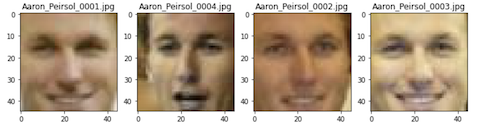

You see that eyes of all the faces lie on one horizontal line and all the faces have almost the same size. If we align all the images in the dataset, we can then train a neural network on aligned images.

**Why we need the alignment procedure**: the alignment of all faces in dataset makes the task of facial recognition easier for the model. If all the faces that model sees are of the same size and have their landmarks (eyes, nose, etc) on almost the same parts of the images, it is easier for the model to learn to identify a person on the image. The model diesn't need to "search" for the face and eyes positions on the image befire performing a recognition.

If you are interested, you can also train a model on non-aligned images, but you'll see that it would perform badly. It is possible though to train a model for face recognition without pre-alignment of all the faces, but this would require a huge amount of data — more that almost any company has. The only company that has openly presented its face recognition system that does not require special alignment is Facebook — their neural network was trained on a really huge amount of data using a special trick to avoid alignment. You can read more details [here](https://research.fb.com/publications/deepface-closing-the-gap-to-human-level-performance-in-face-verification/)

### Model inference

So let's see how the model trained on aligned faces can be used in real world:

Let's assume you owe a company and you want to build a face recognition system for your working office. You decided to hang some cameras around the office and want them to be able to recognize faces of all your employees when they are sitting / walking around the office (we let you decide by yourself why you would need such a system in your office)


A system for face recognition typically conststs of 3 stages:
- face detection
- face alignment
- face recognition

Let's discuss them in detail:

**Face detection**

When the camera is hanged on the wall it records a video and splits the video into single images, like this:

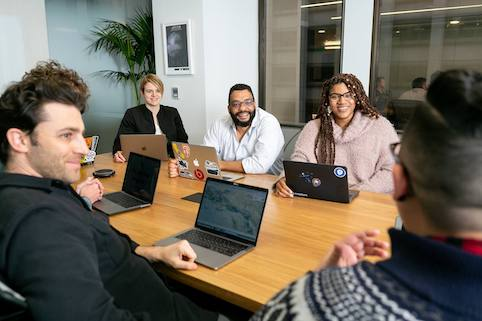

To be able to recognize all the faces on the photo you need first to detect all the faces that are present on the photo, like this:

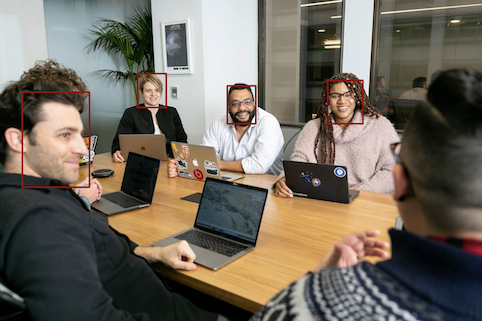

That is the first part — detection. You could use any neural network that can detect humans for this.

**Face alignment**

The second stage is to align all the faces found. The alignment procedure here should be the same as used to align training images.

So we'll get an image of a guy on a photo aligned like this:

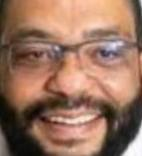

**Face recognition**

On the third stage we use the neural network that we trained to recognize a face.

So that's how the face recognition models pipeline work. You can also read about it more on [this link](https://www.nytimes.com/wirecutter/blog/how-facial-recognition-works/) (and using internet search)

## Neural network model architecture 

Let's discuss how model for face recognition should look like.



The easiest and, actually, the most used way to build a neural network for face recognition is to build it as a **simple classifier**.

Assume we have a dataset with photos of N different people. Then we can build a neural network to classify all the images from the dataset into N classes. Each class refers to one unique person in the dataset.

**How do we recognize new people by this network then?** We actually want the network for face recognition to be able to recognize not only the people which are in training set, but almost every person in the world.

That is how: after training the model, we'll drop it's last classification layer. After that when we'll pass an image of the person through network, we'll get the output of the pre-last layer — it's **the embedding of the image**. Having embeddings of two different images we can compare them using **cosine distance**. The less the distance is — the higher the probability that those two photos belong to one person is. 

Using that technique we can get embeddings of every image — even of unseen people, compare them, and reveal images belonging to same people. 

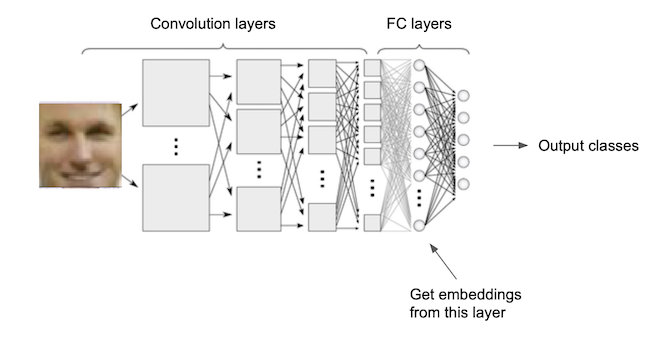

## Task 1 (30% points): build a neural network for faces classification as discribed above.

### Dataset 

We will train out face recognition network on part of the [CelebA dataset](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html). We'll use a version of it that has all the images in it aligned. You can download the dataset using the links: 
- (whole celebA dataset) [dataset with 10177 classes](https://drive.google.com/file/d/1R-J71aJ50ahF-PkmaytLDyvbAiCccQdl/view?usp=sharing)
- [dataset with 1000 classes](https://drive.google.com/file/d/1JT9CMGjIbO7LtUuh8IYRc2OYrY0lGy5r/view?usp=sharing) 

**Important**: images in both datasets are aligned, but not cropped. To crop images, there're files with bboxes coordinates for each image in both datasets

In [ ]:
# !conda config --append channels conda-forge
# !conda install -y gdown

In [ ]:
!gdown https://drive.google.com/uc?id=1cCVVIg75TNsBs5xk7SJZjCfYJnOTZFae

Downloading...
From: https://drive.google.com/uc?id=1cCVVIg75TNsBs5xk7SJZjCfYJnOTZFae
To: /home/ubuntu/celebA_train_1k.zip
100%|████████████████████████████████████████| 180M/180M [00:02<00:00, 81.3MB/s]


In [ ]:
!unzip -q celebA_train_1k.zip

In [ ]:
!ls celebA_train_1k

celebA_anno_1k.txt  celebA_train_split.txt
celebA_imgs	    clist_bbox_celeba_1k.txt


Let's look at the data first:

- celebA_imgs — folder with aligned images 
- celebA_anno.txt — file with annotations: which person each image corresponds to
- celebA_train_split.txt — file with train/val/test info

In [ ]:
# !pip uninstall torch torchvision
# !conda install pytorch torchvision torchaudio cudatoolkit=11.6 -c pytorch -c conda-forge

In [ ]:
import os
import numpy as np
from PIL import Image
from skimage import io, transform

import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from torchvision import models
import torch.nn as nn

from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from IPython.display import clear_output

from pathlib import Path

from collections import Counter

from tqdm.notebook import tqdm
import random

In [ ]:
DATA_DIR = Path('celebA_train_1k')
IMGS_DIR = Path(DATA_DIR / 'celebA_imgs')
MY_MODELS_DIR = Path('MY_MODELS')

TRAIN_SPLIT = 'celebA_train_split.txt'
ANNO = 'celebA_anno_1k.txt'


N_CLASSES = 1000
SEED = 123

In [ ]:
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [ ]:
import pickle
import io

PICKLE_PROTOCOL = 4


def get_file(filename):
    with open(filename, "rb") as f:
        result = pickle.load(f)
    return result


def save_file(object_name, adr, append=False):
    flag = 'ab' if append else 'wb'
    with open(adr, flag) as f:
        pickle.dump(object_name, f, PICKLE_PROTOCOL)
    return 'Done'


class CPU_Unpickler(pickle.Unpickler):
    def find_class(self, module, name):
        if module == 'torch.storage' and name == '_load_from_bytes':
            return lambda b: torch.load(io.BytesIO(b), map_location='cpu')
        else: return super().find_class(module, name)

In [ ]:
def show_imgs_data(imgs_data, imgs_names, denorm=False, supt=None):
    f, axes = plt.subplots(1, len(imgs_data), figsize=(3*len(imgs_data),5))  
    for i, axis in enumerate(axes):
        if denorm:
            img_data = imgs_data[i] * 0.5 + 0.5
            img_data = np.array(img_data.permute(1, 2, 0))
        else:
            img_data = imgs_data[i]
        axes[i].imshow(img_data, cmap='gray')
        axes[i].set_title(imgs_names[i])
    if supt is not None:
        plt.suptitle(supt, fontsize=16, y=0.85)
    plt.tight_layout()
    plt.show()  
    

def show_imgs(images_names):
    imgs = []
    for img in images_names:
      img = Image.open(IMGS_DIR / img)
      imgs.append(np.array(img))
    show_imgs_data(imgs, images_names)

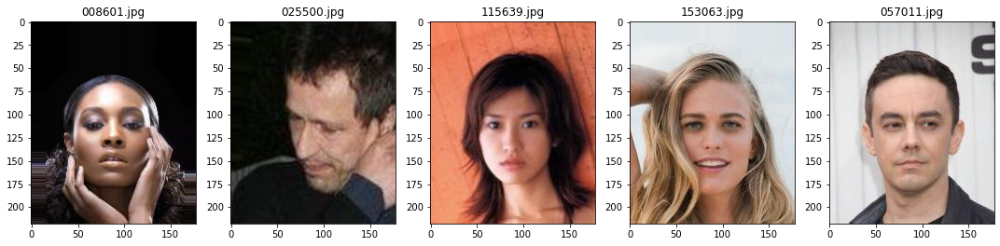

In [ ]:
images_names = os.listdir(IMGS_DIR)[:5]
show_imgs(images_names)

Посмотрим на распределение объектов по учебной, валидационной и тестовой выборкам:

In [ ]:
f = open(DATA_DIR / ANNO, 'r')
lines_classes = f.readlines()
f.close()

f = open(DATA_DIR / TRAIN_SPLIT, 'r')
lines_split = f.readlines()
f.close()

d = dict()

for i in tqdm(range(len(lines_classes))):
    assert lines_classes[i].split()[0] == lines_split[i].split()[0]
    target = int(lines_classes[i].split()[1])
    label = int(lines_split[i].split()[1])
    if target not in d:
        d[target] = [0, 0, 0]
    d[target][label] += 1

  0%|          | 0/23948 [00:00<?, ?it/s]

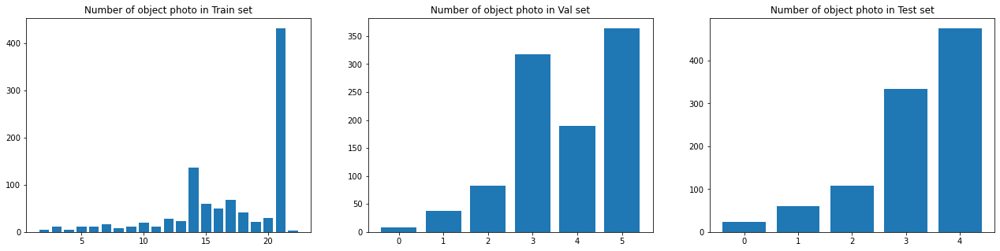

In [ ]:
train_cty = [d[k][0] for k in d]
cnt_train = Counter(train_cty)

val_cty = [d[k][1] for k in d]
cnt_val = Counter(val_cty)

test_cty = [d[k][2] for k in d]
cnt_test = Counter(test_cty)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(22, 5));
ax[0].bar(cnt_train.keys(), cnt_train.values());
ax[0].set_title('Number of object photo in Train set');
ax[1].bar(cnt_val.keys(), cnt_val.values());
ax[1].set_title('Number of object photo in Val set');
ax[2].bar(cnt_test.keys(), cnt_test.values());
ax[2].set_title('Number of object photo in Test set');

In [ ]:
print('Total number of images:\t', sum(train_cty + val_cty + test_cty))
print('\tin Train set:\t', sum(train_cty))
print('\tin Val set:\t', sum(val_cty))
print('\tin Test set:\t', sum(test_cty))

Total number of images:	 23948
	in Train set:	 17038
	in Val set:	 3736
	in Test set:	 3174


Видим, что у нас нет объектов, не представленных в учебной выборке, но имеющихся в валидационной или тестовой выборках: для каждой модели есть минимум 2 фото в трейн-сете. Напротив, в трейне есть около 25 объектов, отсутствующих в валидационной и/или тестовой выборках.

### Train Neural Network

Let's build a Datasets and network using this images:

In [ ]:
def get_paths(dataset_type='train'):
    '''
    a function that returnes list of images paths for a given type of the dataset
    params:
      dataset_type: one of 'train', 'val', 'test'
    '''

    labels_dict = {
        'train': 0,
        'val': 1,
        'test': 2,
    }

    f = open(DATA_DIR / TRAIN_SPLIT, 'r')
    lines = f.readlines()
    f.close()

    lines = [x.strip().split() for x in lines]
    lines = [x[0] for x in lines if int(x[1]) == labels_dict[dataset_type]]

    images_paths = []
    for filename in lines:            
        images_paths.append(IMGS_DIR / filename)
    
    return np.array(images_paths)

Были протестированы различные варианты кропа:
- 90 x 90 px
- 100 x 100 px
- 110 x 110 px

Максимальное качество модели достигалось при размере рамки 110 x 110px (верхняя строка):

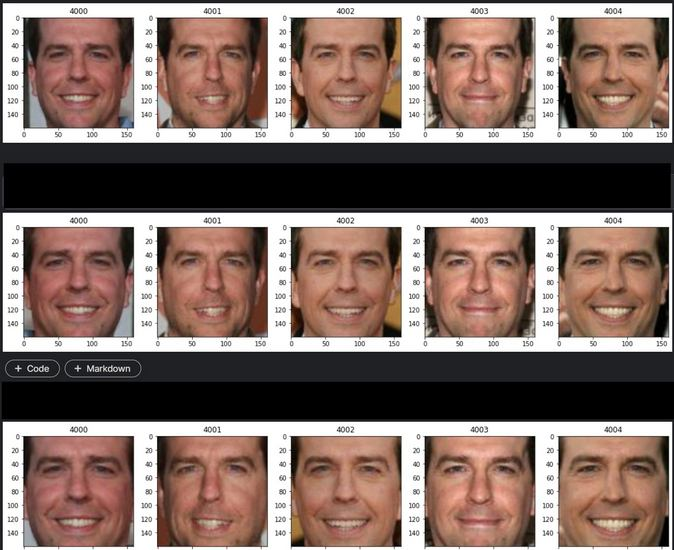

In [ ]:
CROP_PARAMS = {'top':75,
               'left': 34,
               'height': 110,
               'width': 110}

In [ ]:
class celebADataset(Dataset):
    """Feel free to rewrite it. For ex. cache all images in RAM to increase training speed"""
    def __init__(self, dataset_type, transform, aug=None):
        self.dataset_type = dataset_type
        if aug is not None:
            self.transform = transforms.Compose(transform + aug)
        else:
            self.transform = transforms.Compose(transform)
        self.files = get_paths(self.dataset_type)
        f = open(DATA_DIR / ANNO, 'r')
        lines = f.readlines()
        f.close()
        lines = [x.strip().split() for x in lines]
        labels_dict = {img_info[0]: int(img_info[1]) for img_info in lines}
        self.labels = [labels_dict[img_name.name] for img_name in self.files]        
        self.data = [self.load_sample(img_name) for img_name in tqdm(self.files, desc=f'Cashing {dataset_type} data')]                

    def __len__(self):
        return len(self.data)

    def load_sample(self, filename):
        image = Image.open(filename)
        image.load()
        return transforms.functional.crop(image, **CROP_PARAMS)

    def __getitem__(self, idx):        
        x = self.data[idx]
        x = self.transform(x)
        return x, self.labels[idx]

In [ ]:
IMAGE_SIZE = 224

transform = [
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

augmentation = [transforms.RandomHorizontalFlip(),
                transforms.RandomChoice([
                   transforms.RandomErasing(p=0.2, scale=(0.02, 0.33)),
                   transforms.ColorJitter(brightness=0.02, contrast=0.02, saturation=0.02, hue=0.02),
                   transforms.GaussianBlur(kernel_size=(9, 9))                                      
               ])]

In [ ]:
BATCH_SIZE = 32

train_data = celebADataset('train', transform, aug=augmentation)
val_data = celebADataset('val', transform)
test_data = celebADataset('test', transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

Cashing train data:   0%|          | 0/17038 [00:00<?, ?it/s]

Cashing val data:   0%|          | 0/3736 [00:00<?, ?it/s]

Cashing test data:   0%|          | 0/3174 [00:00<?, ?it/s]

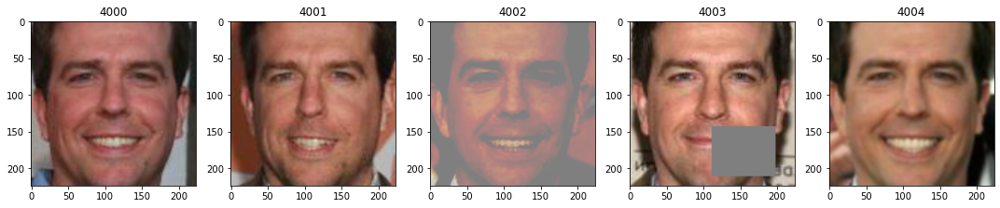

In [ ]:
# Посмотрим на примеры после кропа, ресайза и аугментации

show_imgs_data([train_data[4000+i][0] for i in range(5)], [str(4000+i) for i in range(5)], denorm=True)

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Device type:', device)

Device type: cuda


In [ ]:
EMB_SIZE = 768

torch.cuda.empty_cache()

model = models.convnext_small(weights='ConvNeXt_Small_Weights.DEFAULT')

layers_to_unfreeze = 30

for param in model.features[:-layers_to_unfreeze].parameters():
    param.requires_grad = False

model.classifier._modules['2'] = nn.Linear(EMB_SIZE, N_CLASSES)

model = model.to(device)

**Workflow**: fine-tune a model on train_data using val_data for validation.Use standard CE loss.  Calculate the loss and accuracy on test set after training. 

You may use any optimizer you want and any learning rate. It is also beneficial to freeze starting layers to boost training speed and avoid overfitting. 

Get as high score as possible!

In [ ]:
optimizer = torch.optim.Adam(params=[
    {"params": model.classifier.parameters()},
    {"params": model.features.parameters(), "lr": 4e-5}
  ], 
  lr=4e-4)

criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.3)

N_EPOCHS = 18

In [ ]:
def train(model, optimizer, criterion, scheduler, n_epochs):
    
    train_losses, val_losses, acc_scores = [], [], []
    best_val_loss = np.inf

    for epoch in range(n_epochs):
        print(f'Epoch {epoch + 1} start...')
        model.train()
        train_losses_per_epoch, val_losses_per_epoch = [], []
        preds_per_epoch, targets_per_epoch = [], []
        pbar = tqdm(train_loader)
        for X_batch, y_batch in pbar:

            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            optimizer.zero_grad()
            outputs = model(X_batch)        
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()                        

            train_losses_per_epoch.append(loss.item())
            
            pbar.set_description(f'Train Loss: {train_losses_per_epoch[-1]:.4f}')  

        train_losses.append(np.mean(train_losses_per_epoch))
        if scheduler is not None:
            scheduler.step()
        
        model.eval()
        with torch.no_grad():
            pbar = tqdm(val_loader)
            for X_batch, y_batch in pbar:
                targets_per_epoch.extend(y_batch)

                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)

                outputs = model(X_batch)
                loss = criterion(outputs, y_batch)

                val_losses_per_epoch.append(loss.item())

                preds = torch.argmax(outputs, 1).cpu()        
                preds_per_epoch.extend(preds)

                pbar.set_description(f'Val Loss: {val_losses_per_epoch[-1]:.4f}')

        val_losses.append(np.mean(val_losses_per_epoch))

        acc_scores.append(accuracy_score(targets_per_epoch, preds_per_epoch)) 

        clear_output(True)
        if epoch > 0:
            fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
            x_labels = range(1, epoch + 2)
            ax[0].plot(x_labels, train_losses, label='Train')
            ax[0].plot(x_labels, val_losses, label='Val')
            ax[0].grid(axis='y', linestyle='-.')
            ax[0].set_xlabel('Epoch')
            ax[0].set_title('Loss')
            ax[0].legend()
            ax[1].plot(x_labels, acc_scores)
            ax[1].grid(axis='y', linestyle='-.')
            ax[1].set_xlabel('Epoch')
            ax[1].set_title('Val Accuracy')        
            plt.show()

        print(f"Epoch {epoch + 1} \tTrain Loss: {train_losses[-1]:.3f} \tVal Loss: {val_losses[-1]:.3f} \tAccuracy: {acc_scores[-1]:.3f}")

        if val_losses[-1] < best_val_loss:
            best_val_loss = val_losses[-1]
            save_file(model, MY_MODELS_DIR / 'model_best.pkl')
            
    return {'train_losses': train_losses, 'val_losses': val_losses, 'acc_scores': acc_scores}

In [ ]:
def test(model):
    model.eval()
    with torch.no_grad():
        preds, targets, losses = [], [], []
        for X_batch, y_batch in tqdm(test_loader):
            targets.extend(y_batch)

            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            losses.append(loss.item())
            preds.extend(torch.argmax(outputs, 1).cpu())

    acc = accuracy_score(targets, preds)

    print(f'Test Loss: {np.mean(losses):.3f} \tTestAccuracy: {acc:.3f}')

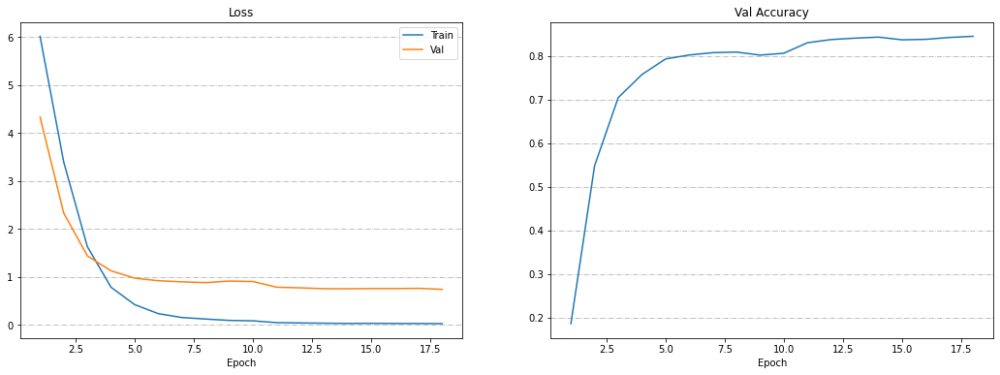

Epoch 18 	Train Loss: 0.020 	Val Loss: 0.735 	Accuracy: 0.845


In [ ]:
model_training_info = train(model, optimizer, criterion, scheduler, N_EPOCHS)

In [ ]:
save_file(model, MY_MODELS_DIR / 'convnext.pkl')

'Done'

In [ ]:
test(model)

  0%|          | 0/100 [00:00<?, ?it/s]

Test Loss: 0.811 	TestAccuracy: 0.839


Итак, модель на основе предобученного ConvNeXt-small справляется с задачей классификации тестовых изображений с Accuracy на уровне 83.9%.<br><br>
Аугментация в виде RandomHorizontalFlip не выглядит слишком логичной, т.к. лицо человека обычно несимметрично, но ее использование наряду с другими аугментациями на учебном датасете помогло улучшить качество модели.<br><br>
Теперь обучим модель на основе Inception Resnet (V1), предобученного на датасете VGGFace2, состоящем из лиц людей, и сравним результаты:

In [ ]:
!pip install facenet-pytorch
from facenet_pytorch import InceptionResnetV1

In [ ]:
IMAGE_SIZE = 160

transform = [
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

augmentation = [transforms.RandomHorizontalFlip()]


train_data = celebADataset('train', transform, aug=augmentation)
val_data = celebADataset('val', transform)
test_data = celebADataset('test', transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

Cashing train data:   0%|          | 0/17038 [00:00<?, ?it/s]

Cashing val data:   0%|          | 0/3736 [00:00<?, ?it/s]

Cashing test data:   0%|          | 0/3174 [00:00<?, ?it/s]

In [ ]:
torch.cuda.empty_cache()

model = InceptionResnetV1(pretrained='vggface2', classify=True, num_classes=N_CLASSES)

layers_to_unfreeze = 10

for param in list(model.parameters())[:-layers_to_unfreeze]:
    param.requires_grad = False

model = model.to(device)

  0%|          | 0.00/107M [00:00<?, ?B/s]

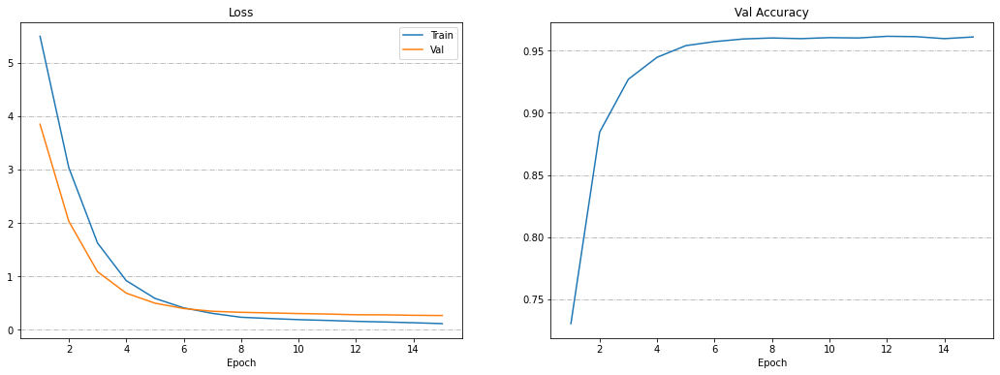

Epoch 15 	Train Loss: 0.113 	Val Loss: 0.265 	Accuracy: 0.961


In [ ]:
optimizer = torch.optim.Adam(params=[
        {"params": list(model.parameters())[-layers_to_unfreeze:]},
        {"params": list(model.parameters())[:-layers_to_unfreeze], "lr": 1e-5}
    ], 
    lr=1e-4)

criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.3)
N_EPOCHS = 15

model_learning_info = train(model, optimizer, criterion, scheduler, N_EPOCHS)

In [ ]:
test(model)

  0%|          | 0/100 [00:00<?, ?it/s]

Test Loss: 0.299 	TestAccuracy: 0.956


Как видим, качество модели на основе предобученного InceptionResnetV1 значительно превышает качество нашей первой модели: **Accuracy 0.956** против **0.839** в первом случае. Это объяснимо, т.к. первая модель была предобучена на датасете из различных фотографий, в то время как вторая - на датасете фотографий лиц людей.<br><br>
Еще одним достоинством второй модели является гораздо более высокая скорость ее обучения: каждая эпоха обучения первой модели занимала 10-20 минут в Colab / Kaggle Code (5 мин. на GPU RTX 3080), в то время как одна эпоха обучения второй модели - менее одной минуты (30 сек. на GPU RTX 3080).

In [ ]:
save_file(model, MY_MODELS_DIR / 'incept_resnet_v1.pkl')

'Done'

**Cosine similarity calculation**: drop a last layer of trained network. Get embeddings for some images from train set and for images from test set. Calculate cosine similarities between embeddings corresponding to the pictures of the same person and different people. Is the difference big in any of cases?

Посмотрим на разницу в косинусной близости эмбеддингов сначала для модели InceptionResnet, а затем для модели ConvNext.

**InceptionResnet:**

In [ ]:
# Let's inspect 30 random persons from our dataset
N_SAMPLES = 30

person_ids = random.sample(range(0, N_CLASSES), N_SAMPLES)

# train data for inspected persons
train_persons_data = [{'data': data[0], 'id': data[1], 'set': 'train'} for data in tqdm(train_data) if data[1] in (person_ids)]

# test data for inspected persons
test_persons_data = [{'data': data[0], 'id': data[1], 'set': 'test'} for data in tqdm(test_data) if data[1] in (person_ids)]

persons_data = train_persons_data + test_persons_data

len(train_persons_data), len(test_persons_data), len(persons_data)

# Dropping the model last layer
model.logits = nn.Identity()

In [ ]:
# Calculating embeddings

model.eval()

for i in tqdm(range(len(persons_data))):
    person_tensor = torch.tensor(persons_data[i]['data']).unsqueeze(0).to(device)
    with torch.no_grad():
        persons_data[i]['emb'] = model(person_tensor).squeeze().cpu().detach().numpy()

  0%|          | 0/610 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


**Cosine similarity distribution**: calculate all the cosine similarities between images in test dataset and train dataset of the same person. This means if you have image of person #106 in test dataset, calculate all similarities between this person's embeddings from test dataset and this person's embeddings from train dataset. 

Then also do that for pairs of different people. This means if you have image of person #106 in test dataset, calculate similarities between this person's embeddings from test dataset and other people embeddings from train dataset. 

This calculation may take a long time and memory since it's a lot of pairs. You can cut the number of pairs which you calculate distances between up to 5k, as an example.

In [ ]:
one_person_sims, dif_persons_sims = [], []

for person_id in tqdm(sorted(person_ids)):
    person_embs_train = np.array([data['emb'] for data in persons_data if data['id'] == person_id and data['set'] == 'train'])
    person_embs_test = np.array([data['emb'] for data in persons_data if data['id'] == person_id and data['set'] == 'test'])
    other_embs_train = np.array([data['emb'] for data in persons_data if data['id'] != person_id and data['set'] == 'train'])

    if person_embs_train.shape[0] > 0 and person_embs_test.shape[0] > 0:
        # Cosine similarities for the train and test embeddings of the same person
        person_similarities = cosine_similarity(person_embs_train, person_embs_test)
        # 2D -> 1D
        one_person_sims.extend([x for xs in person_similarities for x in xs])

    if other_embs_train.shape[0] > 0 and person_embs_test.shape[0] > 0:
        # Cosine similarities for the train and test embeddings of different persons
        person_similarities = cosine_similarity(person_embs_test, other_embs_train)
        dif_persons_sims.extend([x for xs in person_similarities for x in xs])    

print(f'\nNumber of pairs\n\tFor the same person: {len(one_person_sims)}\n\tFor the different persons: {len(dif_persons_sims)}')
print(f'\nMean cosine similarity\n\tFor the same person: {np.mean(one_person_sims):.3f}\n\tFor the different persons: {np.mean(dif_persons_sims):.3f}')

  0%|          | 0/30 [00:00<?, ?it/s]


Number of pairs
	For the same person: 1789
	For the different persons: 47555

Mean cosine similarity
	For the same person: 0.639
	For the different persons: 0.000


Посмотрим на распределение косинусных близостей для эмбеддингов фото одного человека и эмбеддингов фото различных людей:

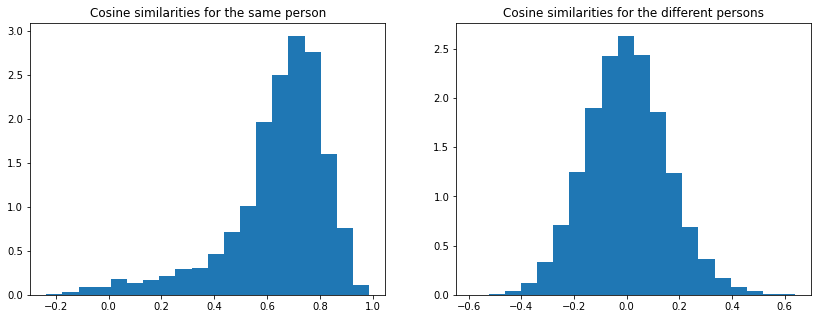

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 5))
ax[0].hist(one_person_sims, bins=20, density=True)
ax[0].set_title('Cosine similarities for the same person')
ax[1].hist(dif_persons_sims, bins=20, density=True)
ax[1].set_title('Cosine similarities for the different persons')
plt.plot();

Видим, что фотографии одного человека имеют эмбеддинги с нормально распределенной (или близко к нормально распределенной) близостью, в среднем равной 0.64, т.е. эти фотографии в основном довольно похожи. В то время как косинусная близость фотографий разных людей также распределена нормально, но со средним около 0.0, т.е. эти фото в основном отличаются друг от друга.

Наконец, посмотрим на сами фотографии.<br>
Сначала пары фотографий одного человека с минимальной (верхние два ряда) и максимальной (средние два ряда) схожестью, а затем на пары фотографий разных людей с максимальной схожестью (нижние два ряда):

In [ ]:
pairs_similar, pairs_dissimilar, pairs_max_sim = [], [], []

thr_same = np.quantile(one_person_sims, [0.05, 0.99])
thr_diff = np.quantile(dif_persons_sims, 0.999)

for person_id in tqdm(sorted(person_ids)):
    person_embs_train = np.array([data['emb'] for data in persons_data if data['id'] == person_id and data['set'] == 'train'])
    person_embs_test = np.array([data['emb'] for data in persons_data if data['id'] == person_id and data['set'] == 'test'])
    other_embs_train = np.array([data['emb'] for data in persons_data if data['id'] != person_id and data['set'] == 'train'])

    person_data_train = [data['data'] for data in persons_data if data['id'] == person_id and data['set'] == 'train']
    person_data_test = [data['data'] for data in persons_data if data['id'] == person_id and data['set'] == 'test']
    other_data_train = [data['data'] for data in persons_data if data['id'] != person_id and data['set'] == 'train']

    if person_embs_train.shape[0] > 0 and person_embs_test.shape[0] > 0:
        person_similarities = cosine_similarity(person_embs_train, person_embs_test)
        idxs_diff = np.argwhere(person_similarities <= thr_same[0])
        idxs_same = np.argwhere(person_similarities >= thr_same[1])
        if idxs_diff.shape[0] > 0:
            pairs_similar.append([person_data_train[idxs_diff[0][0]], person_data_test[idxs_diff[0][1]]])
        if idxs_same.shape[0] > 0:
            pairs_dissimilar.append([person_data_train[idxs_same[0][0]], person_data_test[idxs_same[0][1]]])   

    if other_embs_train.shape[0] > 0 and person_embs_test.shape[0] > 0:
        person_similarities = cosine_similarity(person_embs_test, other_embs_train)
        idxs_max = np.argwhere(person_similarities >= thr_diff)
        if idxs_max.shape[0] > 0:
            pairs_max_sim.append([person_data_test[idxs_max[0][0]], other_data_train[idxs_max[0][1]]])                   

  0%|          | 0/30 [00:00<?, ?it/s]

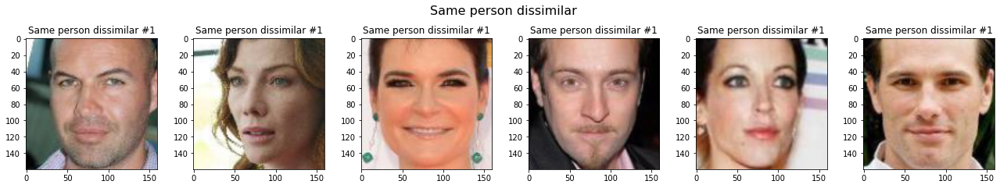

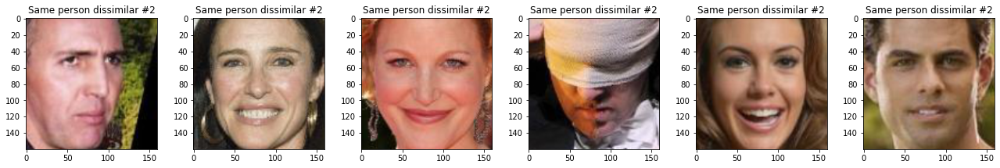

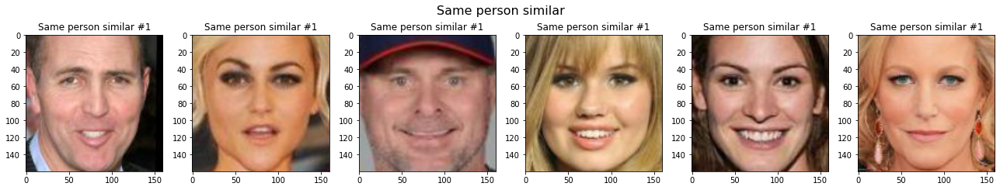

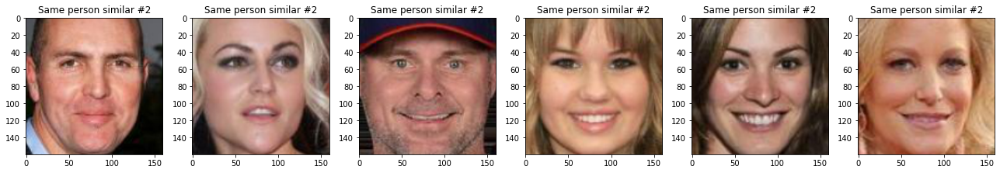

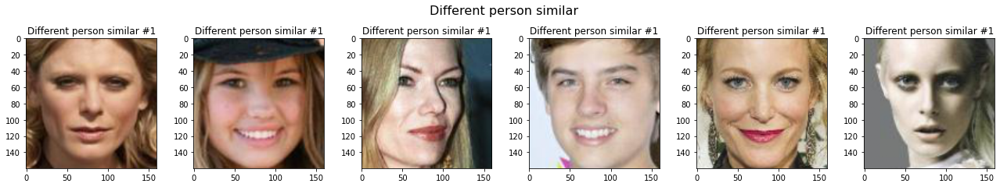

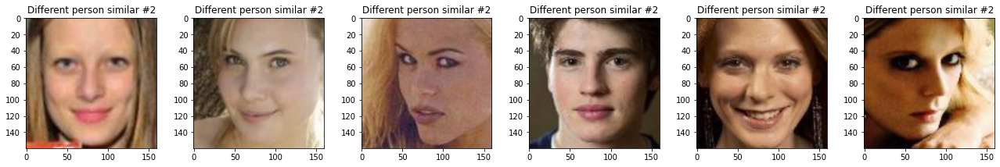

In [ ]:
PAIRS_CNT_TO_SHOW = 6

for pairs, label in zip((pairs_similar, pairs_dissimilar, pairs_max_sim), 
                        ('Same person dissimilar', 'Same person similar', 'Different person similar')):
    for i in range(2):
        show_imgs_data(list(map(lambda x: x[i], pairs[: PAIRS_CNT_TO_SHOW])),
                       [f'{label} #{i + 1}'] * PAIRS_CNT_TO_SHOW,
                       denorm=True,
                       supt=label if not i else None)  

Можно видеть, что на парах фото сверху действительно существуют серьезные различия, и определить, что на них запечатлен один и тот же человек, было бы затруднительно даже для живого человека. В то время как пары фото в центре максимально схожи друг с другом, различаясь лишь небольшими деталями - очевидно, на них запечатлен один и тот же человек.<br><br>
На парах фото внизу находятся разные люди, эмбеддинги которых при этом близки. В некоторых случаях человек мог бы практически безошибочно сделать вывод, что на фото - разные люди, в то время как для нашей модели эти люди выглядят максимально похожими, что можно объяснить большим числом общих паттернов на этих парах фотографий.

Визуализируем распределение косинусных близостей при помощи t-SNE:

In [ ]:
persons_embs = [data['emb'] for data in persons_data]

tsne = TSNE(n_components=2, init='random', learning_rate=200)
persons_embs_transformed = tsne.fit_transform(persons_embs)

for i in range(len(persons_data)):
    persons_data[i]['tsne'] = persons_embs_transformed[i]

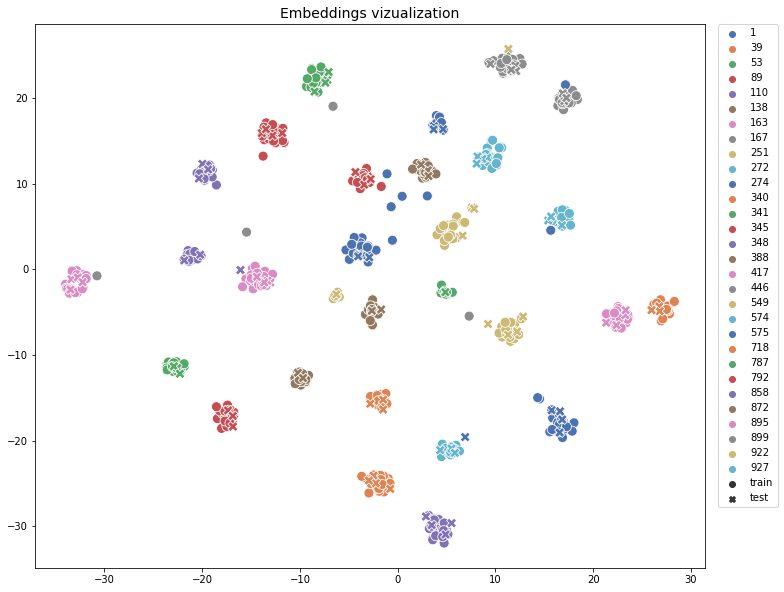

In [ ]:
plt.figure(figsize=(12, 10))

sns.scatterplot(x=[data['tsne'][0] for data in persons_data],
                y=[data['tsne'][1] for data in persons_data],
                hue=[data['id'] for data in persons_data],
                style=[data['set'] for data in persons_data],
                palette='deep',
                s=100);
plt.title('Embeddings vizualization', fontsize=14);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

На графике представлены эмбеддинги фотографий людей из train-сета (круги) и test-сета (крестики). Точки, представляющие собой эмбеддинги для одного и того же человека, окрашены в один цвет.<br>
Видим, что эмбеддинги для каждого человека формируют очень сконцентрированные группы, при этом эмбеддинги для тестовых изображений как правило находятся вместе с эмбеддингами для трейна, что говорит о хорошей обощающей способности модели. Количество случаев, когда эмбеддинги разных людей находятся рядом (т.е. человек идентифицируется ошибочно), невелико, и объясняется большим числом общих паттернов на конкретной фотографии одного человека с фотографиями другого человека.<br><br>
Итак, можно сделать вывод, что модель InceptionResnet действительно довольно успешно справляется с задачей идентификации лиц.

**Теперь проделаем аналогичные операции для модели ConvNext:**

In [ ]:
train_data = celebADataset('train', transform)
test_data = celebADataset('test', transform)

# train data for inspected persons
train_persons_data = [{'data': data[0], 'id': data[1], 'set': 'train'} for data in tqdm(train_data) if data[1] in (person_ids)]

# test data for inspected persons
test_persons_data = [{'data': data[0], 'id': data[1], 'set': 'test'} for data in tqdm(test_data) if data[1] in (person_ids)]

persons_data = train_persons_data + test_persons_data

# Dropping the model last layer
model = get_file(MY_MODELS_DIR / 'convnext.pkl')
model.classifier = nn.Identity()

model.eval()

for i in tqdm(range(len(persons_data))):
    person_tensor = torch.tensor(persons_data[i]['data']).unsqueeze(0).to(device)
    with torch.no_grad():
        persons_data[i]['emb'] = model(person_tensor).squeeze().cpu().detach().numpy()

Cashing train data:   0%|          | 0/17038 [00:00<?, ?it/s]

Cashing test data:   0%|          | 0/3174 [00:00<?, ?it/s]

  0%|          | 0/17038 [00:00<?, ?it/s]

  0%|          | 0/3174 [00:00<?, ?it/s]

  0%|          | 0/606 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


In [ ]:
one_person_sims, dif_persons_sims = [], []

for person_id in tqdm(sorted(person_ids)):
    person_embs_train = np.array([data['emb'] for data in persons_data if data['id'] == person_id and data['set'] == 'train'])
    person_embs_test = np.array([data['emb'] for data in persons_data if data['id'] == person_id and data['set'] == 'test'])
    other_embs_train = np.array([data['emb'] for data in persons_data if data['id'] != person_id and data['set'] == 'train'])

    if person_embs_train.shape[0] > 0 and person_embs_test.shape[0] > 0:
        # Cosine similarities for the train and test embeddings of the same person
        person_similarities = cosine_similarity(person_embs_train, person_embs_test)
        # 2D -> 1D
        one_person_sims.extend([x for xs in person_similarities for x in xs])

    if other_embs_train.shape[0] > 0 and person_embs_test.shape[0] > 0:
        # Cosine similarities for the train and test embeddings of different persons
        person_similarities = cosine_similarity(person_embs_test, other_embs_train)
        dif_persons_sims.extend([x for xs in person_similarities for x in xs])    

print(f'\nNumber of pairs\n\tFor the same person: {len(one_person_sims)}\n\tFor the different persons: {len(dif_persons_sims)}')
print(f'\nMean cosine similarity\n\tFor the same person: {np.mean(one_person_sims):.3f}\n\tFor the different persons: {np.mean(dif_persons_sims):.3f}')

  0%|          | 0/30 [00:00<?, ?it/s]


Number of pairs
	For the same person: 1762
	For the different persons: 47198

Mean cosine similarity
	For the same person: 0.435
	For the different persons: 0.016


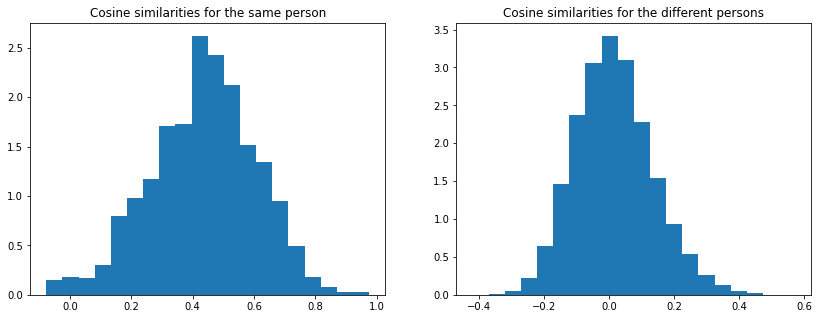

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 5))
ax[0].hist(one_person_sims, bins=20, density=True)
ax[0].set_title('Cosine similarities for the same person')
ax[1].hist(dif_persons_sims, bins=20, density=True)
ax[1].set_title('Cosine similarities for the different persons')
plt.plot();

Заметим, что модель ConvNext так же как и InceptionResnet, успешно справляется с задачей разделения фото различных людей (средняя косинусная близость ~ 0.0), но при этом средняя близость между эмбеддингами фото одного и того же человека значительно меньше: 0.44 против 0.64 у InceptionResnet.

In [ ]:
pairs_similar, pairs_dissimilar, pairs_max_sim = [], [], []

thr_same = np.quantile(one_person_sims, [0.05, 0.99])
thr_diff = np.quantile(dif_persons_sims, 0.999)

for person_id in tqdm(sorted(person_ids)):
    person_embs_train = np.array([data['emb'] for data in persons_data if data['id'] == person_id and data['set'] == 'train'])
    person_embs_test = np.array([data['emb'] for data in persons_data if data['id'] == person_id and data['set'] == 'test'])
    other_embs_train = np.array([data['emb'] for data in persons_data if data['id'] != person_id and data['set'] == 'train'])

    person_data_train = [data['data'] for data in persons_data if data['id'] == person_id and data['set'] == 'train']
    person_data_test = [data['data'] for data in persons_data if data['id'] == person_id and data['set'] == 'test']
    other_data_train = [data['data'] for data in persons_data if data['id'] != person_id and data['set'] == 'train']

    if person_embs_train.shape[0] > 0 and person_embs_test.shape[0] > 0:
        person_similarities = cosine_similarity(person_embs_train, person_embs_test)
        idxs_diff = np.argwhere(person_similarities <= thr_same[0])
        idxs_same = np.argwhere(person_similarities >= thr_same[1])
        if idxs_diff.shape[0] > 0:
            pairs_similar.append([person_data_train[idxs_diff[0][0]], person_data_test[idxs_diff[0][1]]])
        if idxs_same.shape[0] > 0:
            pairs_dissimilar.append([person_data_train[idxs_same[0][0]], person_data_test[idxs_same[0][1]]])   

    if other_embs_train.shape[0] > 0 and person_embs_test.shape[0] > 0:
        person_similarities = cosine_similarity(person_embs_test, other_embs_train)
        idxs_max = np.argwhere(person_similarities >= thr_diff)
        if idxs_max.shape[0] > 0:
            pairs_max_sim.append([person_data_test[idxs_max[0][0]], other_data_train[idxs_max[0][1]]])                   

  0%|          | 0/30 [00:00<?, ?it/s]

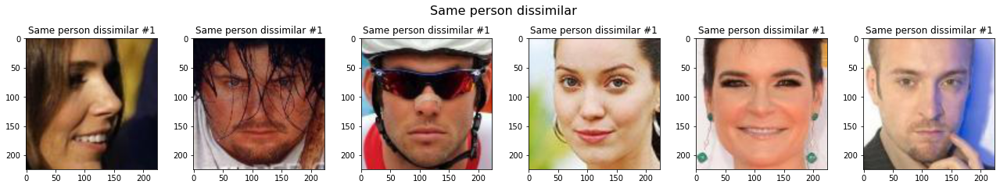

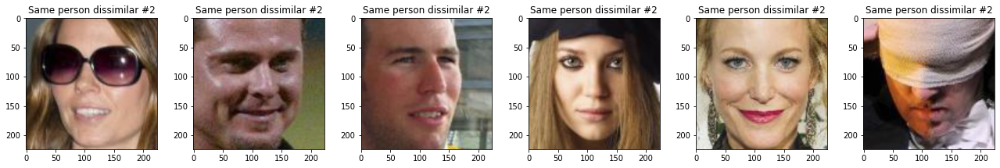

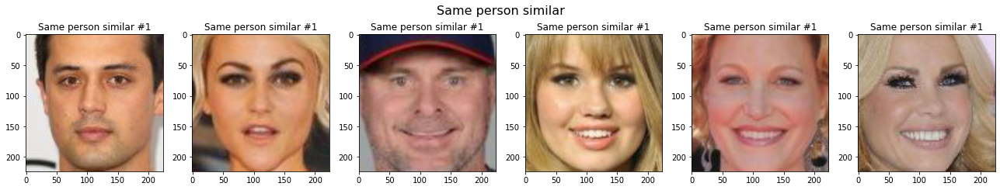

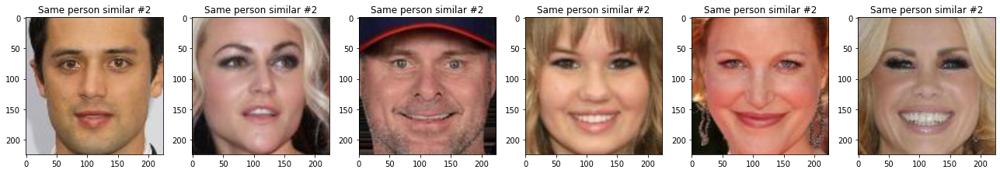

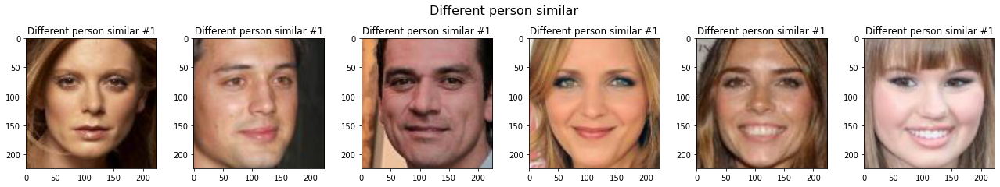

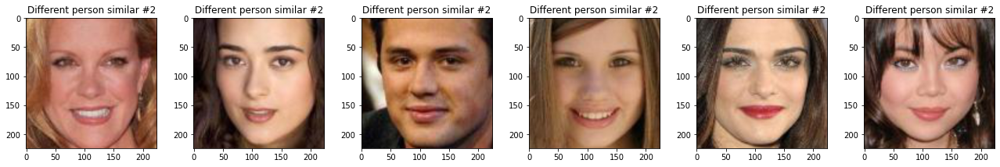

In [ ]:
PAIRS_CNT_TO_SHOW = 6

for pairs, label in zip((pairs_similar, pairs_dissimilar, pairs_max_sim), 
                        ('Same person dissimilar', 'Same person similar', 'Different person similar')):
    for i in range(2):
        show_imgs_data(list(map(lambda x: x[i], pairs[: PAIRS_CNT_TO_SHOW])),
                       [f'{label} #{i + 1}'] * PAIRS_CNT_TO_SHOW,
                       denorm=True,
                       supt=label if not i else None)  

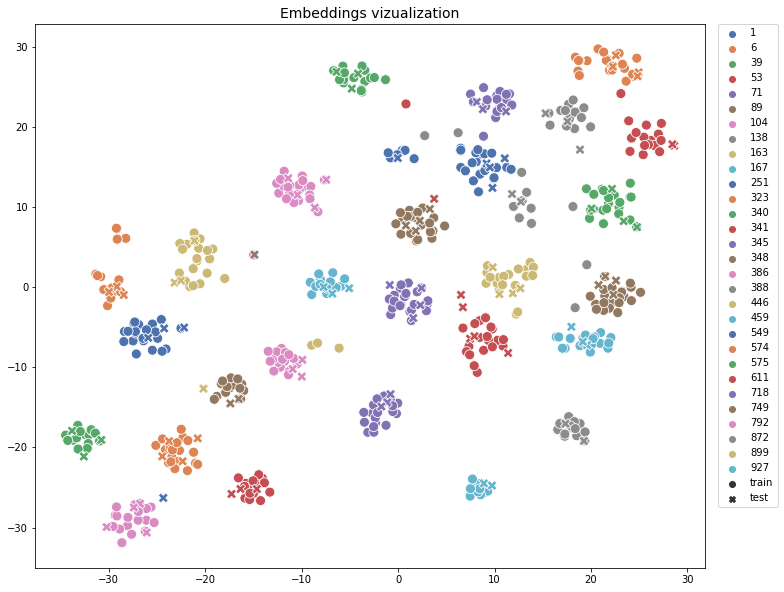

In [ ]:
persons_embs = [data['emb'] for data in persons_data]

from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, init='random', learning_rate=200)
persons_embs_transformed = tsne.fit_transform(persons_embs)

for i in range(len(persons_data)):
    persons_data[i]['tsne'] = persons_embs_transformed[i]

plt.figure(figsize=(12, 10))
sns.scatterplot(x=[data['tsne'][0] for data in persons_data],
                y=[data['tsne'][1] for data in persons_data],
                hue=[data['id'] for data in persons_data],
                style=[data['set'] for data in persons_data],
                palette='deep',
                s=100);
plt.title('Embeddings vizualization', fontsize=14);
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);    

Заметим, что что эмбеддинги для каждого человека в этом случае также формируют сконцентрированные группы, хотя и чуть более разреженные, чем для модели InceptionResnet. Расстояния между группами эмбеддингов для разных людей стали чуть меньше, но эмбеддинги для тестовых изображений по-прежнему в основном находятся вместе с эмбеддингами для трейна.

Можем сделать вывод, что модель ConvNext тоже неплохо справляется с задачей.

## Task 2 (20% points): Identificaton rate metric

When training the model above we used CE loss on val and test set as a measure of performance of our model. But this has a major disadvantage: we can't measure how godd a model would work on unseen faces (which are not present in training, val & test sets)

To address this we can calculate another metric for the model: **identification rate**. This is how it works:

We have two sets of faces: query and distractors. None of the faces from those sets are present in train, val or test sets.

1. calculate cosine similarities between all the faces corresponding to the same people from query dataset. This means if the person has 3 photos in query part: 01.jpg, 02.jpg, 03.jpg, then calculate 3 cosine similarities between every pair of embeddings corresponding to those photos. 
2. calculate cosine similarities between all the faces corresponding to the different people from query dataset. 
3. calculate cosine similarities between all the pairs of embeddings corresponding to query and distractors. This means calculate similarities between pairs (q, d), where q is the embedding that corresponds to a face from query, d — embedding that corresponds to a face from distractors. You'll get |query|*|distractors| similarities.
4. Sum numbers of similarities from 2 and 3 stages. This is a number of false pairs.
5. fix **FPR** (false positive rate). Let it be 0.01 in our case. FPR multiplied by a number of false pairs from the stage 4 is the number of false positives we would allow our model to make. Let's call this number N
6. Sort all the similarities of false pairs by descending order. Get the Nth element from the beginning — that's our **threshold similarity**.
7. Calculate how many positive similarities from stage 1 are equal or more that threshold. Divide this number by whole number of positive similarities from stage 1. This is TPR (true positive rate) — our metric.

This metric can also be expressed as TPR@FPR=0.01. FPR can vary. 

Datasets (query photos, query labels & distructors photos) you can download from here: https://disk.yandex.ru/d/C54mClLmQkag6Q

**Task**: implement the TPR@FPR metric. Calculate it for your model and test dataset on FPR=[0.5, 0.2, 0.1, 0.05].

There're some functions pre-defined and some tests given for better understanding. Please don't change the functions prototypes, so that you can use asserts for checking.

In [ ]:
# ! unzip -q /content/gdrive/MyDrive/FaceRecognition/celebA_ir.zip -d /content/face_recognition_ir

In [ ]:
IR_DIR = Path('celebA_ir')

ANNO_IR = 'celebA_anno_query.txt'
QUERY_SUBDIR = 'celebA_query'
DISTRACTOR_SUBDIR = 'celebA_distractors'

In [ ]:
from collections import defaultdict

# file with query part annotations: which image belongs to which class
# format: 
#     image_name_1.jpg 2678
#     image_name_2.jpg 2679

f = open(IR_DIR / ANNO_IR, 'r')
query_lines = f.readlines()
f.close()
query_lines = [x.strip().split() for x in query_lines]

# plain list of image names from query. Neede to compute embeddings for query
query_img_names = [x[0] for x in query_lines]

# dictionary with info of which images from query belong to which class
# format:
#     {class: [image_1, image_2, ...]}
query_dict = defaultdict(list)
for img_name, img_class in query_lines:
    query_dict[img_class].append(img_name)

# list of distractor images
distractors_img_names = os.listdir(IR_DIR / DISTRACTOR_SUBDIR) 

In [ ]:
class celebA_IR_Dataset(Dataset):
    def __init__(self, images_list, images_dir, transform):
        self.transform = transforms.Compose(transform)
        self.files = images_list       
        self.data = [self.load_sample(images_dir / img_name) for img_name in tqdm(self.files, desc=f'Loading data')]

    def __len__(self):
        return len(self.data)

    def load_sample(self, filename):
        image = Image.open(filename)
        image.load()
        return image        

    def __getitem__(self, idx):        
        x = self.data[idx]
        x = self.transform(x)
        return x, self.files[idx]

In [ ]:
IMAGE_SIZE = 160

transform = [
                    transforms.CenterCrop(83),
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

In [ ]:
def compute_embeddings(model, images_list, images_subdir=QUERY_SUBDIR):
  '''
  compute embeddings from the trained model for list of images.
  params:
    model: trained nn model that takes images and outputs embeddings
    images_list: list of images paths to compute embeddings for
  output:
    list: list of model embeddings. Each embedding corresponds to images 
          names from images_list
  '''
  img_data = celebA_IR_Dataset(images_list, IR_DIR / images_subdir, transform)
  data_loader = torch.utils.data.DataLoader(img_data, batch_size=BATCH_SIZE, shuffle=False)

  filenames_per_eval = []
  embs_per_eval = []
  model.eval()
  with torch.no_grad():
      for X_batch, y_batch in tqdm(data_loader, desc='Calculating embeddings'):
          filenames_per_eval.extend(y_batch)
          X_batch = X_batch.to(device)
          outputs = model(X_batch)
          embs_per_eval.extend(outputs.cpu().detach().numpy())

  # Checking that embeddings correspond to images names
  assert filenames_per_eval == images_list
  return embs_per_eval

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Device type:', device)

Device type: cuda


In [ ]:
model = get_file(MY_MODELS_DIR / 'incept_resnet_v1.pkl')
model.logits = nn.Identity()

In [ ]:
query_embeddings = compute_embeddings(model, query_img_names, images_subdir=QUERY_SUBDIR)
distractors_embeddings = compute_embeddings(model, distractors_img_names, images_subdir=DISTRACTOR_SUBDIR)

Loading data:   0%|          | 0/7198 [00:00<?, ?it/s]

Calculating embeddings:   0%|          | 0/113 [00:00<?, ?it/s]

Loading data:   0%|          | 0/23397 [00:00<?, ?it/s]

Calculating embeddings:   0%|          | 0/366 [00:00<?, ?it/s]

In [ ]:
def compute_cosine_query_pos(query_dict, query_img_names, query_embeddings):
    '''
    compute cosine similarities between positive pairs from query (stage 1)
    params:
      query_dict: dict {class: [image_name_1, image_name_2, ...]}. Key: class in 
                  the dataset. Value: images corresponding to that class
      query_img_names: list of images names
      query_embeddings: list of embeddings corresponding to query_img_names
    output:
      list of floats: similarities between embeddings corresponding 
                      to the same people from query list
    '''
    cos_sims = []
    for person_id in tqdm(query_dict):
        embs = []
        for img_name in query_dict[person_id]:
            ind = query_img_names.index(img_name)
            embs.append(np.array(query_embeddings[ind]))            
        cos_sim = cosine_similarity(np.array(embs))
        del embs
        
        # Excluding self similarities and duplicates
        cos_sims.extend(cos_sim[np.triu_indices_from(cos_sim, k=1)])

    return cos_sims
  

def compute_cosine_query_neg(query_dict, query_img_names, query_embeddings):
    '''
    compute cosine similarities between negative pairs from query (stage 2)
    params:
      query_dict: dict {class: [image_name_1, image_name_2, ...]}. Key: class in 
                  the dataset. Value: images corresponding to that class
      query_img_names: list of images names
      query_embeddings: list of embeddings corresponding to query_img_names
    output:
      list of floats: similarities between embeddings corresponding 
                      to different people from query list
    '''
    cos_sims = []
    for person_id_1 in tqdm(query_dict):
        embs_1 = []
        for img_name_1 in query_dict[person_id_1]:
            ind_1 = query_img_names.index(img_name_1)
            embs_1.append(np.array(query_embeddings[ind_1]))
        for person_id_2 in query_dict:
            # Excluding self similarities and duplicates
            if person_id_2 <= person_id_1:
                continue
            embs_2 = []
            for img_name_2 in query_dict[person_id_2]:
                ind_2 = query_img_names.index(img_name_2)
                embs_2.append(np.array(query_embeddings[ind_2]))
            cos_sim = cosine_similarity(np.array(embs_1), np.array(embs_2))
            del embs_2
            cos_sims.extend([x for xs in cos_sim for x in xs])
        del embs_1
    return cos_sims


def compute_cosine_query_distractors(query_embeddings, distractors_embeddings):
    '''
    compute cosine similarities between negative pairs from query and distractors
    (stage 3)
    params:
      query_embeddings: list of embeddings corresponding to query_img_names
      distractors_embeddings: list of embeddings corresponding to distractors_img_names
    output:
      list of floats: similarities between pairs of people (q, d), where q is 
                      embedding corresponding to photo from query, d —
                      embedding corresponding to photo from distractors
    '''
    cos_sims = cosine_similarity(np.array([data for data in query_embeddings]),
                                 np.array([data for data in distractors_embeddings]))
    return [x for xs in cos_sims for x in xs]

Check you code of functions which compute similarities:

In [ ]:
test_query_dict = {
    2876: ['1.jpg', '2.jpg', '3.jpg'],
    5674: ['5.jpg'],
    864:  ['9.jpg', '10.jpg'],
}
test_query_img_names = ['1.jpg', '2.jpg', '3.jpg', '5.jpg', '9.jpg', '10.jpg']
test_query_embeddings = [
                    [1.56, 6.45,  -7.68],
                    [-1.1 , 6.11,  -3.0],
                    [-0.06,-0.98,-1.29],
                    [8.56, 1.45,  1.11],
                    [0.7,  1.1,   -7.56],
                    [0.05, 0.9,   -2.56],
]

test_distractors_img_names = ['11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg']

test_distractors_embeddings = [
                    [0.12, -3.23, -5.55],
                    [-1,   -0.01, 1.22],
                    [0.06, -0.23, 1.34],
                    [-6.6, 1.45,  -1.45],
                    [0.89,  1.98, 1.45],
]

test_cosine_query_pos = compute_cosine_query_pos(test_query_dict, test_query_img_names, 
                                            test_query_embeddings)
test_cosine_query_neg = compute_cosine_query_neg(test_query_dict, test_query_img_names, 
                                            test_query_embeddings)
test_cosine_query_distractors = compute_cosine_query_distractors(test_query_embeddings, 
                                                            test_distractors_embeddings)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
true_cosine_query_pos = [0.8678237233650096, 0.21226104378511604,
                         -0.18355866977496182, 0.9787437979250561]
assert np.allclose(sorted(test_cosine_query_pos), sorted(true_cosine_query_pos)), \
      "A mistake in compute_cosine_query_pos function"

true_cosine_query_neg = [0.15963231223161822, 0.8507997093616965, 0.9272761484302097,
                         -0.0643994061127092, 0.5412660901220571, 0.701307100338029,
                         -0.2372575528216902, 0.6941032794522218, 0.549425446066643,
                         -0.011982733001947084, -0.0466679194884999]
assert np.allclose(sorted(test_cosine_query_neg), sorted(true_cosine_query_neg)), \
      "A mistake in compute_cosine_query_neg function"

true_cosine_query_distractors = [0.3371426578637511, -0.6866465610863652, -0.8456563512871669,
                                 0.14530087113136106, 0.11410510307646118, -0.07265097629002357,
                                 -0.24097699660707042,-0.5851992679925766, 0.4295494455718534,
                                 0.37604478596058194, 0.9909483738948858, -0.5881093317868022,
                                 -0.6829712976642919, 0.07546364489032083, -0.9130970963915521,
                                 -0.17463101988684684, -0.5229363015558941, 0.1399896725311533,
                                 -0.9258034013399499, 0.5295114163723346, 0.7811585442749943,
                                 -0.8208760031249596, -0.9905139680301821, 0.14969764653247228,
                                 -0.40749654525418444, 0.648660814944824, -0.7432584300096284,
                                 -0.9839696492435877, 0.2498741082804709, -0.2661183373780491]
assert np.allclose(sorted(test_cosine_query_distractors), sorted(true_cosine_query_distractors)), \
      "A mistake in compute_cosine_query_distractors function"

In [ ]:
cosine_query_pos = compute_cosine_query_pos(query_dict, query_img_names, query_embeddings)
cosine_query_neg = compute_cosine_query_neg(query_dict, query_img_names, query_embeddings)

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

In [ ]:
cosine_query_distractors = compute_cosine_query_distractors(query_embeddings, distractors_embeddings)

Implement the final function: identification rate calculation

In [ ]:
def compute_ir(cosine_query_pos, cosine_query_neg, cosine_query_distractors, 
               fpr=0.1):
  '''
  compute identification rate using precomputer cosine similarities between pairs
  at given fpr
  params:
    cosine_query_pos: cosine similarities between positive pairs from query
    cosine_query_neg: cosine similarities between negative pairs from query
    cosine_query_distractors: cosine similarities between negative pairs 
                              from query and distractors
    fpr: false positive rate at which to compute TPR
  output: 
    float: threshold for given fpr 
    float: TPR at given FPR
  '''
  neg_list = cosine_query_neg + cosine_query_distractors
  neg_list.sort(reverse=True)
  false_pairs_number = len(neg_list)
  n = int(fpr * false_pairs_number)
  thr_similarity = neg_list[n]
  return thr_similarity, len([sim for sim in cosine_query_pos if sim >= thr_similarity]) / len(cosine_query_pos)

Check yourself:

In [ ]:
thr = []
tpr = []
for fpr in [0.5, 0.3, 0.1]:
    x, y = compute_ir(test_cosine_query_pos, test_cosine_query_neg, test_cosine_query_distractors, fpr=fpr)
    thr.append(x)
    tpr.append(y)

In [ ]:
true_thr = [-0.011982733001947084, 0.3371426578637511, 0.701307100338029]
assert np.allclose(np.array(thr), np.array(true_thr)), "A mistake in computing threshold"

true_tpr = [0.75, 0.5, 0.5]
assert np.allclose(np.array(tpr), np.array(true_tpr)), "A mistake in computing tpr"

Вычисления на полном объеме данных затруднительны, т.к. размер негативных данных очень большой.<br>Возьмем подвыборку из *cosine_query_distractors* и *cosine_query_neg* объемом 5%:

In [ ]:
cosine_query_distractors_sample = random.sample(cosine_query_distractors, int(len(cosine_query_distractors) / 20))
cosine_query_neg_sample = random.sample(cosine_query_neg, int(len(cosine_query_neg) / 20))

In [ ]:
print(len(cosine_query_neg), '->', len(cosine_query_neg_sample))
print(len(cosine_query_distractors), '->', len(cosine_query_distractors_sample))

25813051 -> 1290652
168411606 -> 8420580


Посмотрим на распределение значений косинусных расстояний:

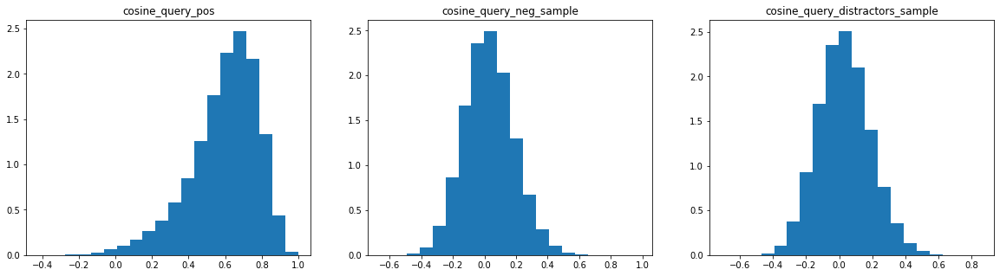

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
ax[0].hist(cosine_query_pos, bins=20, density=True)
ax[0].set_title('cosine_query_pos')
ax[1].hist(cosine_query_neg_sample, bins=20, density=True)
ax[1].set_title('cosine_query_neg_sample')
ax[2].hist(cosine_query_distractors_sample, bins=20, density=True)
ax[2].set_title('cosine_query_distractors_sample')
plt.plot();

Finally compute tpr for faces query and distractors dataset and fpr = [0.5, 0.2, 0.1, 0.05]:

In [ ]:
thrs, tprs, fprs = [], [], []
for fpr in [0.5, 0.2, 0.1, 0.05]:
    thr, tpr = compute_ir(cosine_query_pos, cosine_query_neg_sample, cosine_query_distractors_sample, fpr)
    fprs.append(fpr)
    thrs.append(thr)
    tprs.append(tpr)
    print(f'FPR = {fpr:.2f} : \tThr = {thr:.3f} \tTPR = {tpr:.3f}')

FPR = 0.50 : 	Thr = 0.026 	TPR = 0.990
FPR = 0.20 : 	Thr = 0.161 	TPR = 0.970
FPR = 0.10 : 	Thr = 0.234 	TPR = 0.949
FPR = 0.05 : 	Thr = 0.297 	TPR = 0.924


Визуализируем результаты:

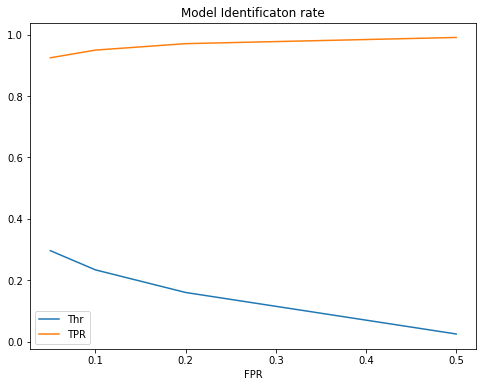

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(fprs, thrs, label='Thr');
plt.plot(fprs, tprs, label='TPR');
plt.xlabel('FPR');
plt.title('Model Identificaton rate');
plt.legend();

Как можно заметить, модель хорошо справдяется с задачей построения эмеддингов фотографий. Эмбеддинги фотографий одного человека в среднем имеют косинусную близость на уровне 0.7, в то время как эмбеддинги для фото разных людей совершенно различны, и в среднем имеют близость около 0.0. Значит, если мы возьмем две фотографии, посчитаем их эмбеддинги с помощью построенной модели и вычислим их косинусную близость, то сможем принимать решение о том, принадлежат ли эти фото одному и тому же человеку на основе отсечки Thr. Выбор отсечки осуществляется в зависимости от задач модели.<br><br>
Например, мы можем полагать, что если значение близости >= 0.026, то на фото - один и тот же человек. Тогда TPR составит 0.990, то есть мы очень точно будем выделять все фото одного и того же человека, но при этом FPR будет 0.50, а значит, мы будем часто ошибочно трактовать фотографии разных людей как принадлежащие одному и тому желовеку.<br><br>
При выборе отсечки на уровне 0.297 TPR составит 0.924, т.е. в 7.6% случаев фотографии одного и того же человека будут полагаться различными, в то же время мы на порядок повысим качество определения фото действительно различных людей: FPR составит всего 0.05.



## Task 3 (50% points): Loss functions

Building a network on task 1 we used an ordinary CE loss. But there are many more variants of loss functions that can be used to train neural network. We will discuss two of them, which are the most popular. More examples of losses for face recognition and their performance reviews you can find in this paper: https://arxiv.org/pdf/1901.05903.pdf

### TripletLoss (25% points)

This is another kind of loss which does not require a model to have last classification layer — it works directly with embeddings. It requires by design to make embeddings of one person be close on embeddings space and embeddings of different people be far away from each other. 

This loss has an advantage over CE-like losses: it does not rely on number of classes in dataset. If we have new faces of new people in a dataset, we won't need to completely retrain the network, we could just fine-tune the trained network on new photos.


**How TripletLoss works**:

Here the architecture of neural network will be slightly different than it was when we used CE loss: it won't have the last classification layer. The last layer of NN will output embeddings of the given photo. 

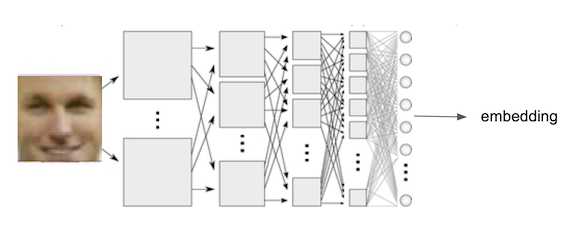

The TripletLoss function works directly with these embeddings. The idea of it is to make embeddings of the same people more close, compact in the embedding space, and the embeddings of the different people be more separate. There's a formula for the loss:

$$L(e, p, n) = max\{d(a, p) - d(a, n) + margin, 0\},$$

where 
- $e$ is embedding of a photo (output of a model)
- $p$ is a positive embedding for the photo (embedding that we want $e$ be close to)
- $n$ is a negative embedding for the photo (embedding that we want $e$ be far from)
- $d(x, y)$ is a distance measure between embeddings 
- margin — a positive margin to further boost the difference between $d(a, p)$ and $d(a, n)$

**All the embeddings $e$, $p$ and $n$ must be normalized before passing them to the loss**.

In our case for the given photo $E$ and it's embedding $e$ positive embedding $p$ must be an embedding of the photo of the same person and embedding $n$ must be an ambedding of the photo of the different person.

This emplementation of TripletLoss for PyTorch can be found [here](https://pytorch.org/docs/stable/generated/torch.nn.TripletMarginWithDistanceLoss.html#torch.nn.TripletMarginWithDistanceLoss). There are different variants of TripletLoss which can also boost performance and which you can implement by yourself, if you want:
- use more that 1 sample of $p$ and $n$ for one embedding $e$ 
- use special kinds of negatives: e.g. the negatives that are the most close to e (to boost them be further away from e)


**More to read about TripletLoss**:

The idea of TripletLoss: https://en.wikipedia.org/wiki/Triplet_loss

PyTorch implementation of TripletLoss: https://pytorch.org/docs/stable/generated/torch.nn.TripletMarginWithDistanceLoss.html#torch.nn.TripletMarginWithDistanceLoss

**Task**: implement a model and train it with TripletLoss. Play with margin parameter to achieve better results.

Which loss among which you have tried is the best?

As we don't have a classification layer in our network, we need a custom procedure for accuracy calculation. You can use one of the following procedures:
- calculate accuracy on val and test sets using KNN with embeddings from training set as training points. (easy way)
- compute mean embeddings for every class from training set and use them as reference embeddings. Then for every embedding v from val and test sets calculate cosine similarities between v and mean embeddings from train set. (the more "right" way, but requires code writing)

You can use any of those two variants.

**Hints**:
- think of what the distance function $d$ should be in our case: training a model we want it to output embeddings which can be compared using cosine similarity function. Pay attention to that cosine similarity is not a distance measure — the more cosine distance, the closer embeddings are. Think how you can put cosine distance into TripletLoss function.
- to train model using this loss you'll need to rewrite the Dataset class so it gives you not the random image and its label, but the image, positive images and negative images for this image;
- don't forget to normalize embeddings for the loss! You may even do that by adding batchnorm/layernorm to the last layer of your network

In [ ]:
import torch.nn.functional as F

In [ ]:
!pip install facenet-pytorch
from facenet_pytorch import InceptionResnetV1

In [ ]:
IMAGE_SIZE = 160
BATCH_SIZE = 32

CROP_PARAMS = {'top':75,
               'left': 34,
               'height': 110,
               'width': 110}

In [ ]:
class celebA_TL_Dataset(Dataset):
    def __init__(self, dataset_type, transform, aug=None):
        self.dataset_type = dataset_type
        if aug is not None:
            self.transform = transforms.Compose(aug + transform)
        else:
            self.transform = transforms.Compose(transform)        
        self.files = get_paths(self.dataset_type)
        f = open(DATA_DIR / ANNO, 'r')
        lines = f.readlines()
        f.close()
        lines = [x.strip().split() for x in lines]
        labels_dict = {img_info[0]: int(img_info[1]) for img_info in lines}
        self.labels = [labels_dict[img_name.name] for img_name in self.files]        
        self.data = [self.load_sample(img_name) for img_name in tqdm(self.files, desc=f'Cashing {dataset_type} data')]                

    def __len__(self):
        return len(self.data)

    def load_sample(self, filename):
        image = Image.open(filename)
        image.load()
        return transforms.functional.crop(image, **CROP_PARAMS)

    def __getitem__(self, idx):     
        x = self.transform(self.data[idx])
        if self.dataset_type != 'train':
            return x, self.labels[idx]
        else:    
            # Return image, positive image and negative image for this image
            positive_idxs = [i for i, label in enumerate(self.labels) if label == self.labels[idx] and i != idx]
            negative_idxs = [i for i, label in enumerate(self.labels) if label != self.labels[idx]]

            pos_idx = random.choice(positive_idxs)
            neg_idx = random.choice(negative_idxs)

            pos_item = self.transform(self.data[pos_idx])
            neg_item = self.transform(self.data[neg_idx])

            return x, pos_item, neg_item, self.labels[idx]

In [ ]:
transform = [                    
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

augmentation = [transforms.RandomHorizontalFlip()]

In [ ]:
train_data = celebA_TL_Dataset('train', transform, aug=augmentation)
val_data = celebA_TL_Dataset('val', transform)
test_data = celebA_TL_Dataset('test', transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

Cashing train data:   0%|          | 0/17038 [00:00<?, ?it/s]

Cashing val data:   0%|          | 0/3736 [00:00<?, ?it/s]

Cashing test data:   0%|          | 0/3174 [00:00<?, ?it/s]

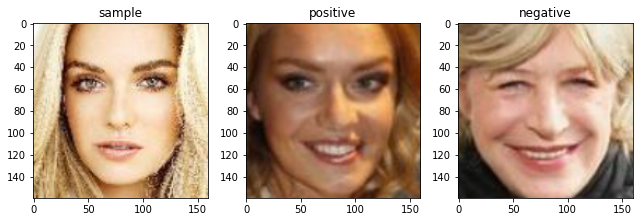

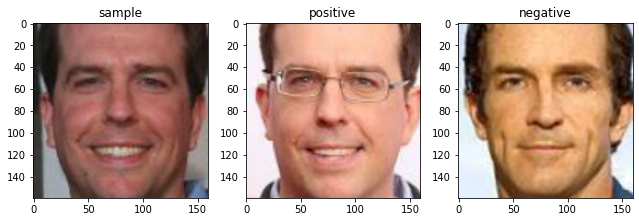

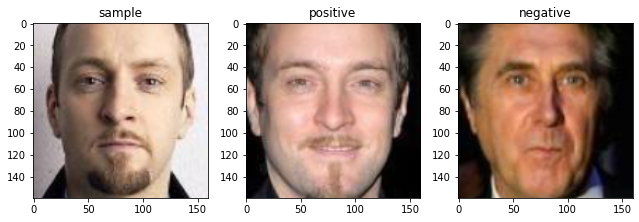

In [ ]:
# Посмотрим на несколько примеров, а также на позитивный и негативный сэмплы к ним

show_imgs_data(train_data[100][:-1], ['sample', 'positive', 'negative'], denorm=True)
show_imgs_data(train_data[4000][:-1], ['sample', 'positive', 'negative'], denorm=True)
show_imgs_data(train_data[6000][:-1], ['sample', 'positive', 'negative'], denorm=True)

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Device type:', device)

Device type: cuda


In [ ]:
torch.cuda.empty_cache()

model = InceptionResnetV1(pretrained='vggface2', classify=False, num_classes=N_CLASSES)

layers_to_unfreeze = 10

for param in list(model.parameters())[:-layers_to_unfreeze]:
    param.requires_grad = False

model.logits = nn.Identity()    

model = model.to(device)

In [ ]:
MARGIN = 0.5

optimizer = torch.optim.Adam(params=[
        {"params": list(model.parameters())[-layers_to_unfreeze:]},
        {"params": list(model.parameters())[:-layers_to_unfreeze], "lr": 1e-5}
    ], 
    lr=1e-4)

criterion = nn.TripletMarginWithDistanceLoss(distance_function=lambda x, y: 1.0 - F.cosine_similarity(x, y),
                                             margin=MARGIN)

N_EPOCHS = 3

In [ ]:
def moving_average(a, n=10) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

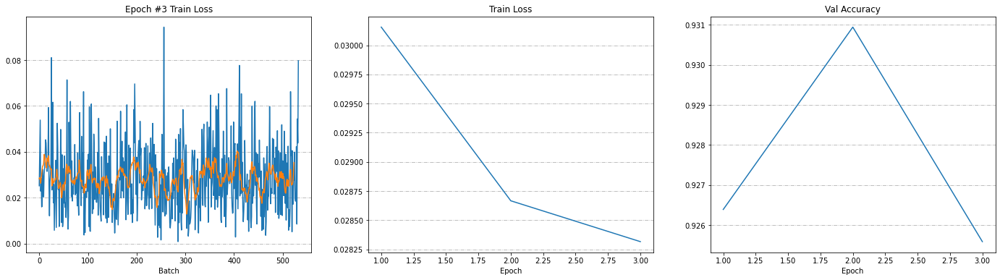

Epoch 3 	Train Loss: 0.028 	Val Accuracy: 0.926


In [ ]:
train_losses, acc_scores = [], []
best_val_acc = 0

for epoch in range(N_EPOCHS):
    print(f'Epoch {epoch + 1} start...')
    model.train()
    train_losses_per_epoch = []
    train_embs = [[] for i in range(N_CLASSES)]
    preds_per_epoch, targets_per_epoch = [], []
    pbar = tqdm(train_loader)
    for sample_batch, pos_batch, neg_batch, label_batch in pbar:               
        
        sample_batch = sample_batch.to(device)
        pos_batch = pos_batch.to(device)
        neg_batch = neg_batch.to(device)

        optimizer.zero_grad()

        sample_out = F.normalize(model(sample_batch))
        pos_out = F.normalize(model(pos_batch))
        neg_out = F.normalize(model(neg_batch))
      
        loss = criterion(sample_out, pos_out, neg_out)
        loss.backward()
        optimizer.step()

        train_losses_per_epoch.append(loss.item())

        # Saving train embeddings
        outputs = sample_out.cpu().detach().numpy()
        for i in range(outputs.shape[0]):
            train_embs[label_batch[i]].append(outputs[i])
               
        pbar.set_description(f'Mean Train Loss: {np.mean(train_losses_per_epoch):.4f}')             

    train_losses.append(np.mean(train_losses_per_epoch))

    # Computing mean embeddings for every class in train
    for i in range(len(train_embs)):
        train_embs[i] = np.mean(train_embs[i], axis=0)

    model.eval()
    with torch.no_grad():
        for sample_batch, label_batch in tqdm(val_loader):

            targets_per_epoch.extend(label_batch)

            sample_batch = sample_batch.to(device)
            sample_out = F.normalize(model(sample_batch))

            outputs = sample_out.cpu().detach().numpy()
            outputs_similarities = cosine_similarity(outputs, train_embs)
            preds = np.argmax(outputs_similarities, axis=1)                   
            preds_per_epoch.extend(preds)

    acc_scores.append(accuracy_score(targets_per_epoch, preds_per_epoch)) 
    
    clear_output(True)
    if epoch > 0:
        fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24, 6))
        ax[0].plot(train_losses_per_epoch)
        ax[0].plot(moving_average(train_losses_per_epoch))
        ax[0].grid(axis='y', linestyle='-.')
        ax[0].set_xlabel('Batch')
        ax[0].set_title(f'Epoch #{epoch + 1} Train Loss')
        x_labels = range(1, epoch + 2)
        ax[1].plot(x_labels, train_losses)
        ax[1].grid(axis='y', linestyle='-.')
        ax[1].set_xlabel('Epoch')
        ax[1].set_title('Train Loss')
        ax[2].plot(x_labels, acc_scores)
        ax[2].grid(axis='y', linestyle='-.')
        ax[2].set_xlabel('Epoch')
        ax[2].set_title('Val Accuracy')        
        plt.show()

    print(f"Epoch {epoch + 1} \tTrain Loss: {train_losses[-1]:.3f} \tVal Accuracy: {acc_scores[-1]:.3f}")
    
    if acc_scores[-1] > best_val_acc:
        best_val_acc = acc_scores[-1]
        save_file(model, MY_MODELS_DIR / 'model_tl_best.pkl')

In [ ]:
def test_triplet(model):
    model.eval()
    with torch.no_grad():
        train_embs = [[] for i in range(N_CLASSES)]

        for sample_batch, _, _, label_batch in tqdm(train_loader,
                                                    desc='Computing mean train embeddings'):                       
            sample_batch = sample_batch.to(device)  
            sample_out = F.normalize(model(sample_batch))

            # Saving train embeddings
            outputs = sample_out.cpu().detach().numpy()
            for i in range(outputs.shape[0]):
                train_embs[label_batch[i]].append(outputs[i])                         

        # Computing mean embeddings for every class in train
        for i in range(len(train_embs)):
            train_embs[i] = np.mean(train_embs[i], axis=0)

        preds_per_epoch, targets_per_epoch = [], []
        for sample_batch, label_batch in tqdm(test_loader):

            targets_per_epoch.extend(label_batch)

            sample_batch = sample_batch.to(device)
            sample_out = F.normalize(model(sample_batch))

            outputs = sample_out.cpu().detach().numpy()
            outputs_similarities = cosine_similarity(outputs, train_embs)
            preds = np.argmax(outputs_similarities, axis=1)                   
            preds_per_epoch.extend(preds)

    print(f'Test Accuracy: {accuracy_score(targets_per_epoch, preds_per_epoch):.3f}')

In [ ]:
test_triplet(model)

Computing mean train embeddings:   0%|          | 0/533 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Test Accuracy: 0.922


In [ ]:
model_triple_best = get_file(MY_MODELS_DIR / 'model_tl_best.pkl')
test_triplet(model_triple_best)

Computing mean train embeddings:   0%|          | 0/533 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Test Accuracy: 0.928


Модель на основе Triplet Loss очень быстро обучается  - в зависимости от Learning Rate достаточно от 1 до 3 эпох обучения, далее Accuracy начинает падать. В нашем случае лучшим оказалось качество модели после двух эпох обучения. При этом само обучение довольно "дорогое": из-за более высокой вычислительной сложности одна эпоха занимает в 3-4 раза больше времени, чем при использовании Cross Entropy Loss.<br><br>
Качество модели с Triplet Loss оказалось чуть ниже, чем при использовании Cross Entropy Loss (Accuracy 0.928 против 0.956). Возможно, качество удалось бы поднять при более интелеллектуальном подборе кандидатов для positive и negative сэмплов в триплете или при увеличении количества экземпляров каждого класса и усреднении их эмбеддингов при подаче в лосс.

### ArcFace Loss (Additive Angular Margin Loss) (25% points)

This loss is somewhat "SOTA" for face recognition systems (somewhat — because actually different variants of losses and their combinations may be the best for different network architectures). This loss inherits idea from CE loss but further develops it to achieve better embeddings distribution on a sphere. It introduces some geodesic constraints to enhance intra-class compactness and inter-class discrepancy.



**How ArcFace loss works**:

This loss is a variation of a standard SoftMax CE loss, which enforces embeddings of different classes (people) be further away: have a more sparse representation of embeddings in embedding space, enforce more evident gap between the nearest classes.

The standard SoftMax CE loss for classification task is presented as follows:

$$L_{CE} = \frac{-1}{N}\sum_1^N \frac{e^{W_{y_i}^{T}x_i + b_{y_i}}}{\sum^n_{j=1}e^{W_j^Tx_i+b_j}},$$

where:
- $x_i \in \mathbb{R^d}$ denotes the deep feature of the $i$-th sample, belonging to the $y_i$-th class;
- $W_j \in \mathbb{R^d}$ denotes the j-th column of the weight;
- $W \in \mathbb{R^d}$ and $b_j \in \mathbb{R^d}$ is the bias term;
- $N$ — batch size;
- $n$ — class number.

It appears, that, though this loss works well, it does not explicitly optimise the feature embedding to enforce higher similarity for intra- class samples and diversity for inter-class samples, which results in a performance gap for deep face recognition under large intra-class appearance variations.

Let's do some work on this loss formula:
- fix the bias $b_j=0$;
- normalize weight ||$W_j$|| = 1;
- normalize embedding ||$x_i$|| = 1 and re-scale it to s (s is a hyperparameter)

The normalisation step on embeddings and weights makes the predictions only depend on the angle between the embedding and the weight. The learned embeddings fare thus distributed on a hypersphere with a radius of s.

So we get the following loss function now:

$$L = \frac{-1}{N}\sum_1^N \frac{e^{s\ cos\Theta_{y_i}}}{e^{s\ cos\Theta_{y_i}} + \sum^n_{j=1,\ j\ne y_i} e^{s\ cos\Theta_j}}$$

Final step: let's add an additive angular margin penalty $m$ between $x_i$ and $W_{y_i}$ to simultaneously enhance the intra-class compactness and inter-class discrepancy:

$$L_{ArcFace} = \frac{-1}{N}\sum_1^N \frac{e^{s\ cos(\Theta_{y_i} + m)}}{e^{s\ cos(\Theta_{y_i} + m)} + \sum^n_{j=1,\ j\ne y_i} e^{s\ cos\Theta_j}}$$

SO this is an ArcFace loss. It has 2 hyperparameters: s and m.

The original paper to read about ArcFace more precisely: https://arxiv.org/pdf/1801.07698.pdf

The original repo, where you can find a code sample: https://github.com/deepinsight/insightface

**Task**: implement a model and train it with ArcFace loss. Play with ArcFace loss parameters and see if you can beat a model with CE loss.

Сначала попробуем обучить с ArcFace Loss модель InceptionResnetV1:

In [ ]:
!pip install facenet-pytorch
from facenet_pytorch import InceptionResnetV1

In [ ]:
IMAGE_SIZE = 160
EMB_SIZE = 512
N_CLASSES = 1000

transform = [
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

augmentation = [transforms.RandomHorizontalFlip()]

In [ ]:
train_data = celebADataset('train', transform, aug=augmentation)
val_data = celebADataset('val', transform)
test_data = celebADataset('test', transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

Cashing train data:   0%|          | 0/17038 [00:00<?, ?it/s]

Cashing val data:   0%|          | 0/3736 [00:00<?, ?it/s]

Cashing test data:   0%|          | 0/3174 [00:00<?, ?it/s]

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Device type:', device)

Device type: cuda


In [ ]:
import math
import torch.nn.functional as F
from torch.nn import Parameter

class AddMarginProduct(nn.Module):
    """ 
    https://github.com/ronghuaiyang/arcface-pytorch/blob/master/models/metrics.py
    """  
    """Implement of large margin cosine distance: :
    Args:
        in_features: size of each input sample
        out_features: size of each output sample
        s: norm of input feature
        m: margin
        cos(theta) - m
    """

    def __init__(self, in_features, out_features, s=30.0, m=0.40):
        super(AddMarginProduct, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.s = s
        self.m = m
        self.weight = Parameter(torch.FloatTensor(out_features, in_features))
        nn.init.xavier_uniform_(self.weight)

    def forward(self, input, label):
        # --------------------------- cos(theta) & phi(theta) ---------------------------
        cosine = F.linear(F.normalize(input), F.normalize(self.weight))
        phi = cosine - self.m
        # --------------------------- convert label to one-hot ---------------------------
        one_hot = torch.zeros(cosine.size(), device='cuda')
        # one_hot = one_hot.cuda() if cosine.is_cuda else one_hot
        one_hot.scatter_(1, label.view(-1, 1).long(), 1)
        # -------------torch.where(out_i = {x_i if condition_i else y_i) -------------
        output = (one_hot * phi) + ((1.0 - one_hot) * cosine)  # you can use torch.where if your torch.__version__ is 0.4
        output *= self.s
        # print(output)

        return output

    def __repr__(self):
        return self.__class__.__name__ + '(' \
               + 'in_features=' + str(self.in_features) \
               + ', out_features=' + str(self.out_features) \
               + ', s=' + str(self.s) \
               + ', m=' + str(self.m) + ')'

In [ ]:
def train_arcface(model, optimizer, criterion, arcface, scheduler, n_epochs, LR, to_squeeze=False):
    
    train_losses, val_losses, acc_scores = [], [], []
    best_val_acc = 0

    optimizer_arcface = torch.optim.AdamW(arcface.parameters(), lr=LR)

    for epoch in range(n_epochs):
        print(f'Epoch {epoch + 1} start...')
        train_embs = [[] for i in range(N_CLASSES)]
        model.train()
        train_losses_per_epoch = []
        preds_per_epoch, targets_per_epoch = [], []
        pbar = tqdm(train_loader)
        for X_batch, y_batch in pbar:

            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            optimizer.zero_grad()
            optimizer_arcface.zero_grad()

            outputs = model(X_batch)
            if to_squeeze:
                outputs = outputs.squeeze()
                
            feature = arcface(outputs, y_batch)                                        

            loss = criterion(feature, y_batch)
            loss.backward()
            optimizer.step()
            optimizer_arcface.step()        

            train_losses_per_epoch.append(loss.item())

            # Saving train embeddings
            outputs = outputs.cpu().detach().numpy()
            for i in range(outputs.shape[0]):
                train_embs[y_batch[i]].append(outputs[i])
            
            pbar.set_description(f'Train Loss: {train_losses_per_epoch[-1]:.4f}')  

        train_losses.append(np.mean(train_losses_per_epoch))

        # Computing mean embeddings for every class in train
        for i in range(len(train_embs)):
            train_embs[i] = np.mean(train_embs[i], axis=0)

        if scheduler is not None:
            scheduler.step()        

        model.eval()
        with torch.no_grad():
            for X_batch, y_batch in tqdm(val_loader):
                targets_per_epoch.extend(y_batch)

                X_batch = X_batch.to(device)                

                outputs = model(X_batch)
                outputs = outputs.cpu().detach().numpy()
                if to_squeeze:
                    outputs = outputs.squeeze()

                outputs_similarities = cosine_similarity(outputs, train_embs)
                preds = np.argmax(outputs_similarities, axis=1)                                      
                preds_per_epoch.extend(preds)       

        acc_scores.append(accuracy_score(targets_per_epoch, preds_per_epoch)) 

        clear_output(True)
        if epoch > 0:
            fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))
            x_labels = range(1, epoch + 2)
            ax[0].plot(x_labels, train_losses)
            ax[0].grid(axis='y', linestyle='-.')
            ax[0].set_xlabel('Epoch')
            ax[0].set_title('Train Loss')
            ax[1].plot(x_labels, acc_scores)
            ax[1].grid(axis='y', linestyle='-.')
            ax[1].set_xlabel('Epoch')
            ax[1].set_title('Val Accuracy')        
            plt.show()

        print(f"Epoch {epoch + 1} \tTrain Loss: {train_losses[-1]:.3f} \tAccuracy: {acc_scores[-1]:.3f}")

        if acc_scores[-1] > best_val_acc:
            best_val_acc = acc_scores[-1]
            save_file(model, MY_MODELS_DIR / 'model_arcface_best.pkl')            
            
    return {'train_losses': train_losses, 'acc_scores': acc_scores}

In [ ]:
def test_arcface(model, to_squeeze=False):
    model.eval()
    with torch.no_grad():
        train_embs = [[] for i in range(N_CLASSES)]

        for sample_batch, label_batch in tqdm(train_loader,
                                              desc='Computing mean train embeddings'):                       
            sample_batch = sample_batch.to(device)  
            sample_out = model(sample_batch)
            if to_squeeze:
                sample_out = sample_out.squeeze()                

            # Saving train embeddings
            outputs = sample_out.cpu().detach().numpy()
            for i in range(outputs.shape[0]):
                train_embs[label_batch[i]].append(outputs[i])                         

        # Computing mean embeddings for every class in train
        for i in range(len(train_embs)):
            train_embs[i] = np.mean(train_embs[i], axis=0)

        preds_per_epoch, targets_per_epoch = [], []
        for sample_batch, label_batch in tqdm(test_loader, desc='Inference'):

            targets_per_epoch.extend(label_batch)

            sample_batch = sample_batch.to(device)
            sample_out = model(sample_batch)
            
            if to_squeeze:
                sample_out = sample_out.squeeze()

            outputs = sample_out.cpu().detach().numpy()
            outputs_similarities = cosine_similarity(outputs, train_embs)
            preds = np.argmax(outputs_similarities, axis=1)                   
            preds_per_epoch.extend(preds)

    print(f'Test Accuracy: {accuracy_score(targets_per_epoch, preds_per_epoch):.3f}')

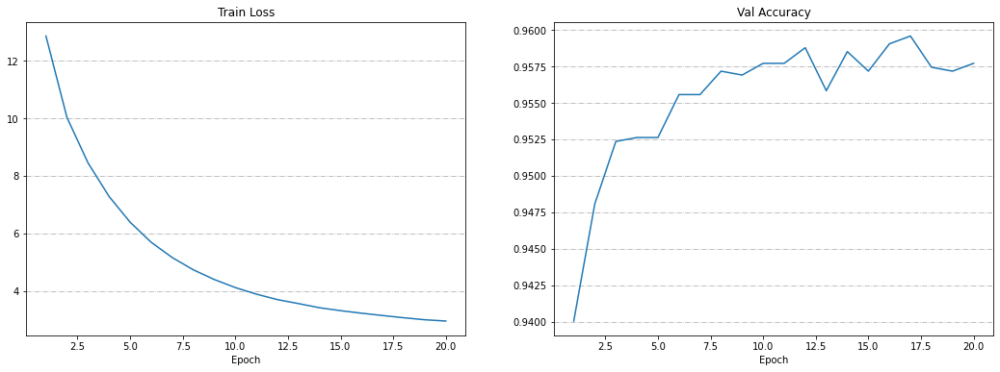

Epoch 20 	Train Loss: 2.953 	Accuracy: 0.958


In [ ]:
torch.cuda.empty_cache()

model = InceptionResnetV1(pretrained='vggface2', classify=True, num_classes=N_CLASSES)

layers_to_unfreeze = 10

for param in list(model.parameters())[:-layers_to_unfreeze]:
    param.requires_grad = False

model.logits = nn.Identity()    

model = model.to(device)

optimizer = torch.optim.Adam(params=[
        {"params": list(model.parameters())[-layers_to_unfreeze:]},
        {"params": list(model.parameters())[:-layers_to_unfreeze], "lr": 2e-5}
    ], 
    lr=2e-4)

criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.3)
arcface = AddMarginProduct(EMB_SIZE, N_CLASSES, s=20, m=0.4).to(device)

N_EPOCHS = 20
ARCFACE_LR = 1e-4

model_training_info = train_arcface(model, optimizer, criterion, arcface, None, N_EPOCHS, ARCFACE_LR)

In [ ]:
test_arcface(model)

Computing mean train embeddings:   0%|          | 0/533 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Test Accuracy: 0.951


In [ ]:
save_file(model, MY_MODELS_DIR / 'model_arcface.pkl')

'Done'

Улучшить качество модели InceptionResnet не удалось. Но отметим, что при использовании ArcFace Loss модель обучается очень быстро, Accuracy уже после первой эпохи - на уровне 0.94. С увеличением количества эпох обучения качество модели растет, но в итоге упирается примерно в те же значения, что и модель, обученная при помощи Cross Entropy Loss. Также отметим, что в сравнении с Triplet Loss каждая эпоха обучения проходит в 3-4 раза быстрее.<br><br>
К недостатком подхода с использованием ArcFace Loss можно отнести появление дополнительных гиперпараметров m и s и необходимость их подбора.<br><br>
Теперь обучим с использованием ArcFace Loss модель ConvNext:

In [ ]:
IMAGE_SIZE = 224

transform = [
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

augmentation = [transforms.RandomHorizontalFlip(),
                transforms.RandomChoice([
                   transforms.RandomErasing(p=0.2, scale=(0.02, 0.33)),
                   transforms.ColorJitter(brightness=0.02, contrast=0.02, saturation=0.02, hue=0.02),
                   transforms.GaussianBlur(kernel_size=(9, 9)),                                      
               ])]

BATCH_SIZE = 32

train_data = celebADataset('train', transform, aug=augmentation)
val_data = celebADataset('val', transform)
test_data = celebADataset('test', transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

Cashing train data:   0%|          | 0/17038 [00:00<?, ?it/s]

Cashing val data:   0%|          | 0/3736 [00:00<?, ?it/s]

Cashing test data:   0%|          | 0/3174 [00:00<?, ?it/s]

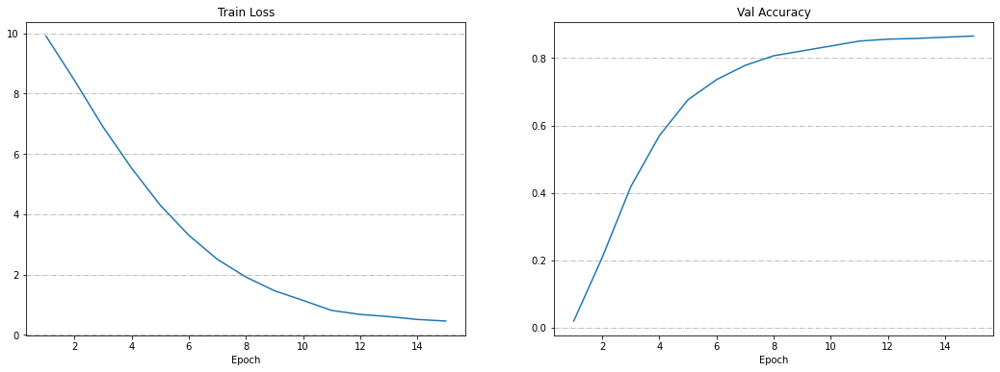

Epoch 15 	Train Loss: 0.455 	Accuracy: 0.866


In [ ]:
torch.cuda.empty_cache()

EMB_SIZE = 768

model = models.convnext_small(weights='ConvNeXt_Small_Weights.DEFAULT')

layers_to_unfreeze = 40

for param in model.features[:-layers_to_unfreeze].parameters():
    param.requires_grad = False

model.classifier = nn.Identity()

model = model.to(device)

optimizer = torch.optim.Adam(params=[
    {"params": model.classifier.parameters()},
    {"params": model.features.parameters(), "lr": 4e-5}
  ], 
  lr=4e-4)

criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.3)
arcface = AddMarginProduct(EMB_SIZE, N_CLASSES, s=30, m=0.1).to(device)

N_EPOCHS = 15
ARCFACE_LR = 1e-4

model_training_info = train_arcface(model, optimizer, criterion, arcface, scheduler, N_EPOCHS, ARCFACE_LR, to_squeeze=True)

In [ ]:
test_arcface(model, to_squeeze=True)

Computing mean train embeddings:   0%|          | 0/533 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Test Accuracy: 0.852


In [ ]:
save_file(model, MY_MODELS_DIR / 'convnext_arcface.pkl')

'Done'

В случае ConvNext за счет использования ArcFace Loss нам удалось улучшить качество модели: Accuracy достигла 0.852 (при использовании Cross Entropy Loss лучший результат был 0.839).

## Bonus task (5% points): Finding trash photos 

You have probably noticed that in identification rate calculation we use cosine similarity between embeddings, which includes embeddings' normalization. And in TripletLoss also we normalize embeddings before passing them to the loss. Actually this is how most of the face recognition algorithms work — they are designed to output a normalized embeddings and any comparison between embeddings is done after the embeddings are normalized. Sometimes it may be beneficial even to add a normalization layer (batchnorm or layernorm with fixed parameters) after the model's embedding layer to make the model output normalized embeddings.

But norms of the unnormalized embeddings can also be used. They can be used to detect trash photos — photos, where the face is presented really badly (e.g. back of the head instead of the forehead or even a photo without any head that has appeared in a dataset due to a mistake in face detection / landmarks detection algorithm).

Empirically it has been found that the higher the embedding's norm, the more the probability of the corresponding photo to be trash is. 



**Task**: get the embeddings of photos in a test set / query set / distractors set. Sort them by their norms. Output the photos whose embeddings norms are the highest. Do they look like normal or trash?

**Doing this task will not give you points above 100% for the whole homework. But if you have any mistakes in previous sections, doing this task may give you additional points (5% of total points) to cover points lost.**

In [ ]:
!pip install facenet-pytorch
from facenet_pytorch import InceptionResnetV1

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Device type:', device)

Device type: cuda


Посмотрим на фото с максимальными нормами эмбеддингов для модели ConvNext и для модели InceptionResnet на основе Cross Entropy / на основе ArcFace:

**Test Dataset:**

In [ ]:
model_convnext = CPU_Unpickler(open(MY_MODELS_DIR / 'convnext.pkl', 'rb')).load()
model_convnext.classifier = nn.Identity()
model_convnext = model_convnext.to(device)

model_ce = CPU_Unpickler(open(MY_MODELS_DIR / 'incept_resnet_v1.pkl', 'rb')).load()
model_arcface = CPU_Unpickler(open(MY_MODELS_DIR / 'model_arcface.pkl', 'rb')).load()

for model in [model_ce, model_arcface]:
    model.last_bn = nn.Identity()
    model.logits = nn.Identity()
    model = model.to(device)

In [ ]:
IMAGE_SIZE = 224

transform = [
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

test_data = celebADataset('test', transform)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

Cashing test data:   0%|          | 0/3174 [00:00<?, ?it/s]

In [ ]:
def compute_embeddings_celeba(model, data_loader):
  embs_per_eval = []
  model.eval()
  with torch.no_grad():
      for X_batch, _ in tqdm(data_loader, desc='Calculating embeddings'):
          X_batch = X_batch.to(device)
          outputs = model(X_batch)
          embs_per_eval.extend(outputs.cpu().detach().numpy())
          
  return embs_per_eval

In [ ]:
test_embs_conv = compute_embeddings_celeba(model_convnext, test_loader)
test_embs_conv = [emb.squeeze() for emb in test_embs_conv]
test_norms_conv = [np.linalg.norm(emb) for emb in test_embs_conv]

Calculating embeddings:   0%|          | 0/50 [00:00<?, ?it/s]

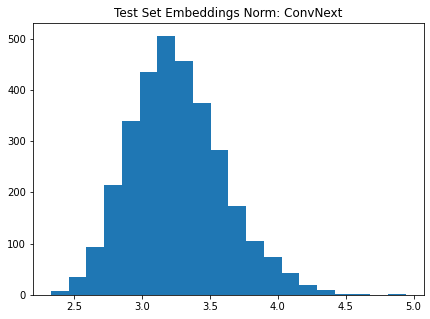

In [ ]:
plt.figure(figsize=(7, 5));
plt.hist(test_norms_conv, bins=20);
plt.title('Test Set Embeddings Norm: ConvNext');

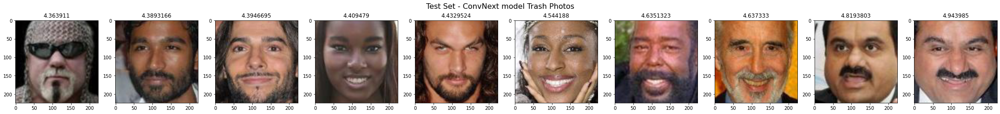

In [ ]:
highest_norms_idx_conv = np.argsort(test_norms_conv)[-10:]

show_imgs_data([test_data[i][0] for i in highest_norms_idx_conv],
                  [str(test_norms_conv[i]) for i in highest_norms_idx_conv],
                  denorm=True, supt='Test Set - ConvNext model Trash Photos')

Модель на основе ConvNext частично справляется с задачей выделения "неправильных" фото: на части фотографий у модели неестественное выражение лица, либо часть лица скрыта (головной убор, темные очки, руки на лице).<br><br>
Теперь посмотрим, как с этой задачей справится модель на основе InceptionResnet.

In [ ]:
IMAGE_SIZE = 160

transform = [
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

test_data = celebADataset('test', transform)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

Cashing test data:   0%|          | 0/3174 [00:00<?, ?it/s]

In [ ]:
test_embs_ce = compute_embeddings_celeba(model_ce, test_loader)
test_embs_arcface = compute_embeddings_celeba(model_arcface, test_loader)

Calculating embeddings:   0%|          | 0/50 [00:00<?, ?it/s]

Calculating embeddings:   0%|          | 0/50 [00:00<?, ?it/s]

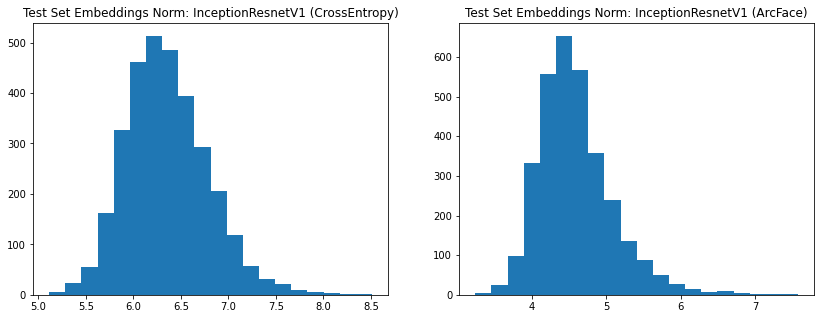

In [ ]:
test_norms_ce = [np.linalg.norm(emb) for emb in test_embs_ce]
test_norms_arcface = [np.linalg.norm(emb) for emb in test_embs_arcface]

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 5));
ax[0].hist(test_norms_ce, bins=20)
ax[0].set_title('Test Set Embeddings Norm: InceptionResnetV1 (CrossEntropy)');
ax[1].hist(test_norms_arcface, bins=20)
ax[1].set_title('Test Set Embeddings Norm: InceptionResnetV1 (ArcFace)');

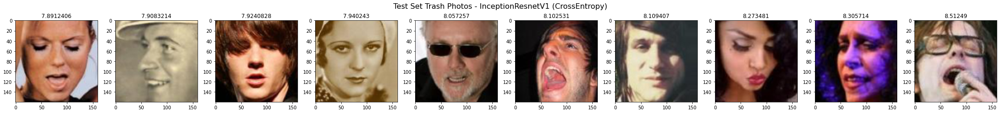

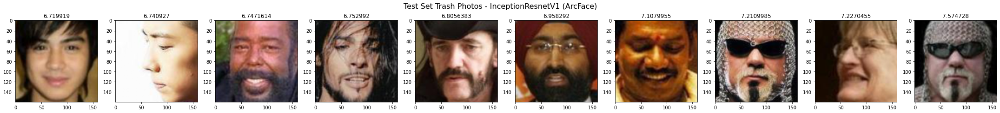

In [ ]:
highest_norms_idx_ce = np.argsort(test_norms_ce)[-10:]
highest_norms_idx_arcface = np.argsort(test_norms_arcface)[-10:]

show_imgs_data([test_data[i][0] for i in highest_norms_idx_ce],
                  [str(test_norms_ce[i]) for i in highest_norms_idx_ce],
                  denorm=True, supt='Test Set Trash Photos - InceptionResnetV1 (CrossEntropy)')

show_imgs_data([test_data[i][0] for i in highest_norms_idx_arcface],
                  [str(test_norms_arcface[i]) for i in highest_norms_idx_arcface],
                  denorm=True, supt='Test Set Trash Photos - InceptionResnetV1 (ArcFace)')

Модель на основе InceptionResnet ожидаемо лучше справилась с задачей нахождения trash фото. На верхней строке - фотографии с максимальными нормами эмбеддингов фото из тестового датасета для модели на основе Cross Entropy, на следующей - для модели ArcFace.<br><br>
Можно понять логику в выделении "неправильных" фото первой моделью - например, сюда попали черно-белые фотографии, фотографии моделей с закрытыми глазами, в темных очках, с широко открытым ртом.
Для второй модели логика выбора "неправильных" фото не так очевидна, хотя здесь также есть фото с моделями в темных очках или с закрытыми глазами, а также немало фото людей неевропейской внешности.

In [ ]:
IMAGE_SIZE = 160

transform = [
                    transforms.CenterCrop(83),
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

img_data_query = celebA_IR_Dataset(query_img_names, IR_DIR / QUERY_SUBDIR, transform)
img_data_distractors = celebA_IR_Dataset(distractors_img_names, IR_DIR / DISTRACTOR_SUBDIR, transform)

data_loader_query = torch.utils.data.DataLoader(img_data_query, batch_size=BATCH_SIZE, shuffle=False)
data_loader_distractors = torch.utils.data.DataLoader(img_data_distractors, batch_size=BATCH_SIZE, shuffle=False)

Loading data:   0%|          | 0/7198 [00:00<?, ?it/s]

Loading data:   0%|          | 0/23397 [00:00<?, ?it/s]

**Query Dataset:**

In [ ]:
query_embs_ce = compute_embeddings_celeba(model_ce, data_loader_query)
query_embs_arcface = compute_embeddings_celeba(model_arcface, data_loader_query)

query_norms_ce = [np.linalg.norm(emb) for emb in query_embs_ce]
query_norms_arcface = [np.linalg.norm(emb) for emb in query_embs_arcface]

highest_norms_idx_ce = np.argsort(query_norms_ce)[-10:]
highest_norms_idx_arcface = np.argsort(query_norms_arcface)[-10:]

Calculating embeddings:   0%|          | 0/113 [00:00<?, ?it/s]

Calculating embeddings:   0%|          | 0/113 [00:00<?, ?it/s]

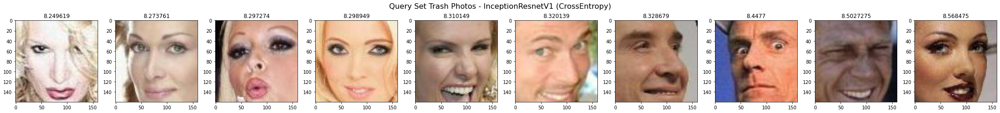

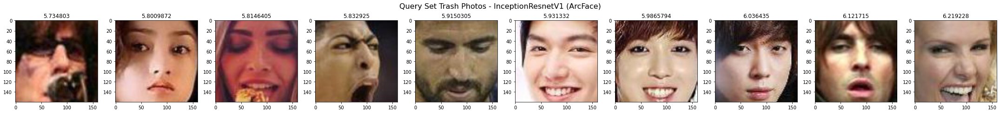

In [ ]:
show_imgs_data([img_data_query[i][0] for i in highest_norms_idx_ce],
                  [str(query_norms_ce[i]) for i in highest_norms_idx_ce],
                  denorm=True, supt='Query Set Trash Photos - InceptionResnetV1 (CrossEntropy)')

show_imgs_data([img_data_query[i][0] for i in highest_norms_idx_arcface],
                  [str(query_norms_arcface[i]) for i in highest_norms_idx_arcface],
                  denorm=True, supt='Query Set Trash Photos - InceptionResnetV1 (ArcFace)')

Видим, что в случае Query датасета модель InceptionResnet на основе обоих лоссов неплохо справляется с задачей определения "странных" фото. Лица имеют либо неестественное выражение, либо часть лица скрыта (микрофон, еда). Однако, модель на основе ArcFace снова посчитала странными некоторые фото моделей неевропейской внешности.

**Distractors Dataset:**

In [ ]:
distr_embs_ce = compute_embeddings_celeba(model_ce, data_loader_query)
distr_embs_arcface = compute_embeddings_celeba(model_arcface, data_loader_query)

distr_norms_ce = [np.linalg.norm(emb) for emb in distr_embs_ce]
distr_norms_arcface = [np.linalg.norm(emb) for emb in distr_embs_arcface]

highest_norms_idx_ce = np.argsort(distr_norms_ce)[-10:]
highest_norms_idx_arcface = np.argsort(distr_norms_arcface)[-10:]

Calculating embeddings:   0%|          | 0/113 [00:00<?, ?it/s]

Calculating embeddings:   0%|          | 0/113 [00:00<?, ?it/s]

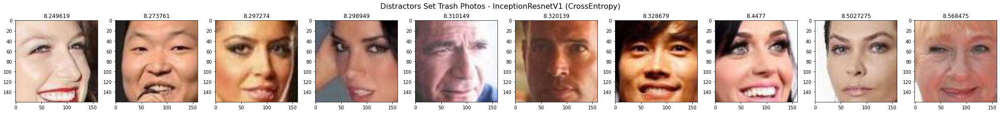

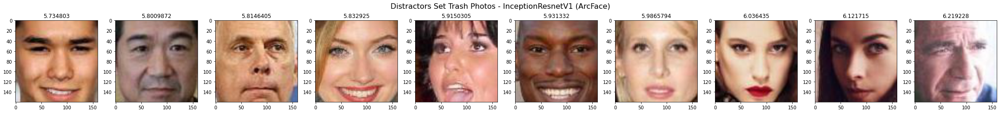

In [ ]:
show_imgs_data([img_data_distractors[i][0] for i in highest_norms_idx_ce],
                  [str(distr_norms_ce[i]) for i in highest_norms_idx_ce],
                  denorm=True, supt='Distractors Set Trash Photos - InceptionResnetV1 (CrossEntropy)')

show_imgs_data([img_data_distractors[i][0] for i in highest_norms_idx_arcface],
                  [str(distr_norms_arcface[i]) for i in highest_norms_idx_arcface],
                  denorm=True, supt='Distractors Set Trash Photos - InceptionResnetV1 (ArcFace)')

В случае Distractors датасета результаты определения "неправильных" фото уже не выглядят такими однозначными. Наряду со случаями, когда у модели широко открыт рот, часть лица скрыта, либо присутствуют руки на фото, модель посчитала "странными" несколько вполне обычных фото.

## What's next

What else can you do with this homework:
1. Try to train the network on faces which are aligned differently (or not aligned at all). The dataset can be downloaded here[link text](https://drive.google.com/drive/folders/0B7EVK8r0v71pTUZsaXdaSnZBZzg?resourcekey=0-rJlzl934LzC-Xp28GeIBzQ)
2. Try to mix different losses while training. This often helps.
3. Try other losses from [this](https://arxiv.org/pdf/1901.05903.pdf) paper
4. Train bigger model on bigger dataset, as whole celebA, add [LFW](http://vis-www.cs.umass.edu/lfw/) and other
5. Explore embeddings spaces you get out of different models. How well are embeddings clasterized? Are they evenly spreaded on the sphere? How could you suggest to make it better?

Проверим, способны ли модели, обученные нами на датасете CelebA с 1000 классами, точно предсказывать персонажей из датасета на 10К классов без дополнительного обучения, основываясь только на данных об эмбеддингах.

In [ ]:
!gdown https://drive.google.com/uc?id=1zZ-OYr1DKGqgFgfD4_XycRM9f2E-cjJ7

In [ ]:
!unzip -q celebA_full.zip

In [ ]:
!ls celebA_full

identity_CelebA.txt  img_align_celeba  list_bbox_celeba.txt


In [ ]:
DATA_DIR = Path('celebA_full')
IMGS_DIR = Path(DATA_DIR / 'img_align_celeba')
MY_MODELS_DIR = Path('MY_MODELS')

ANNO = 'identity_CelebA.txt'

SEED = 123
BATCH_SIZE = 64

In [ ]:
f = open(DATA_DIR / ANNO, 'r')
lines_classes = f.readlines()
f.close()

d = dict()
images, targets = [], []

for i in tqdm(range(len(lines_classes))):
    img_name = lines_classes[i].split()[0]
    target = int(lines_classes[i].split()[1])
    images.append(img_name)
    targets.append(target)
    if target not in d:
        d[target] = []
    d[target].append(img_name)

print('Total number of images:', len(images))  
print('Total number of classes:', len(d))

  0%|          | 0/202599 [00:00<?, ?it/s]

Total number of images: 202599
Total number of classes: 10177


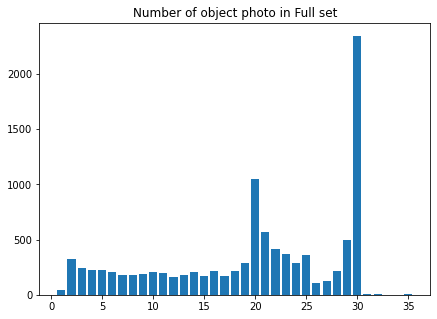

In [ ]:
imgs_count = [len(v) for v in d.values()]
cnt = Counter(imgs_count)

plt.figure(figsize=(7, 5))
plt.bar(cnt.keys(), cnt.values());
plt.title('Number of object photo in Full set');

Видим, что в датасете есть классы с 1-2 фото. Избавимся от них.

In [ ]:
MIN_PHOTO_CNT = 3
targets_to_delete = [k for k in d if len(d[k]) < MIN_PHOTO_CNT]

print('Number of classes to delete:', len(targets_to_delete))

images = [images[i] for i in range(len(targets)) if targets[i] not in targets_to_delete]
targets = [targets[i] for i in range(len(targets)) if targets[i] not in targets_to_delete]

print('Final number of classes:', len(set(targets)))
print('Final number of images:', len(images))

Number of classes to delete: 368
Final number of classes: 9809
Final number of images: 201907


In [ ]:
# Перейдем от исходных таргетов (0..10176) к таргетам 0..9808

idx_to_target = dict(enumerate(list(set(targets))))
target_to_idx = {v: k for k, v in idx_to_target.items()}

In [ ]:
img_train, img_test, target_train, target_test = train_test_split(
                            images,
                            list(map(lambda x: target_to_idx[x], targets)),
                            test_size=0.2, random_state=SEED, shuffle=True, stratify=targets)

In [ ]:
cnt_train = Counter(target_train)
cnt_test = Counter(target_test)

N_CLASSES = len(set(targets))

print('Number of classes in Train set', len(cnt_train))
print('Number of classes in Test set', len(cnt_test))

assert len(cnt_train) == len(set(targets))

Number of classes in Train set 9809
Number of classes in Test set 9600


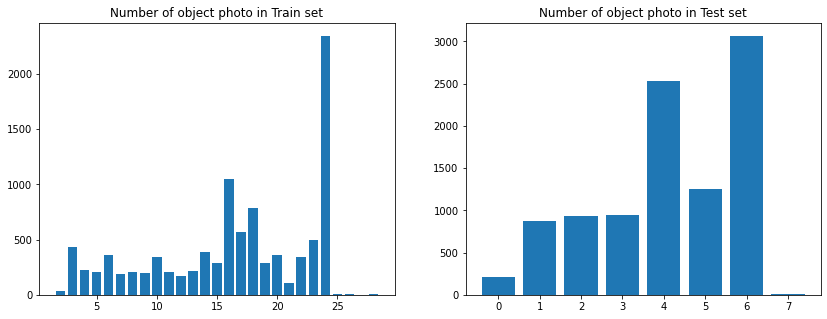

In [ ]:
cnt_train_num = Counter(cnt_train.values())
cnt_test_num = Counter(cnt_test.values())

cnt_test_num[0] = len(cnt_train) - len(cnt_test)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 5));
ax[0].bar(cnt_train_num.keys(), cnt_train_num.values());
ax[0].set_title('Number of object photo in Train set');
ax[1].bar(cnt_test_num.keys(), cnt_test_num.values());
ax[1].set_title('Number of object photo in Test set');

In [ ]:
CROP_PARAMS = {'top':75,
               'left': 34,
               'height': 110,
               'width': 110}
   
IMAGE_SIZE = 160

transform = [
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

In [ ]:
class celebA_Full_Dataset(Dataset):
    def __init__(self, files_list, targets_list, transform):
        assert len(files_list) == len(targets_list)
        self.transform = transforms.Compose(transform)
        self.files = files_list
        self.labels = targets_list 

    def __len__(self):
        return len(self.files)

    def load_sample(self, filename):
        image = Image.open(IMGS_DIR / filename)
        image.load()
        return transforms.functional.crop(image, **CROP_PARAMS)

    def __getitem__(self, idx):        
        x = self.load_sample(self.files[idx])
        x = self.transform(x)
        return x, self.labels[idx]

In [ ]:
# Датасет и даталоадер для модели InceptionResnet

train_data = celebA_Full_Dataset(img_train, target_train, transform)
test_data = celebA_Full_Dataset(img_test, target_test, transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
IMAGE_SIZE_CONV = 224

transform_conv = [
                    transforms.Resize(IMAGE_SIZE_CONV),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

In [ ]:
# Датасет и даталоадер для модели ConvNext

train_data_conv = celebA_Full_Dataset(img_train, target_train, transform_conv)
test_data_conv = celebA_Full_Dataset(img_test, target_test, transform_conv)

train_loader_conv = torch.utils.data.DataLoader(train_data_conv, batch_size=BATCH_SIZE, shuffle=False)
test_loader_conv = torch.utils.data.DataLoader(test_data_conv, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print('Device type:', device)

Device type: cuda


In [ ]:
model_ce = CPU_Unpickler(open(MY_MODELS_DIR / 'incept_resnet_v1.pkl', 'rb')).load()
model_ce.last_bn = nn.Identity()
model_ce.logits = nn.Identity()
model_ce = model_ce.to(device)


model_convnext = CPU_Unpickler(open(MY_MODELS_DIR / 'convnext_arcface.pkl', 'rb')).load()
model_convnext.classifier = nn.Identity()
model_convnext = model_convnext.to(device)

In [ ]:
def test_emb_model(model, train_loader, test_loader, to_squeeze=False):
    model.eval()
    with torch.no_grad():
        train_embs = [[] for i in range(N_CLASSES)]

        for sample_batch, label_batch in tqdm(train_loader,
                                              desc='Computing mean train embeddings'):                       
            sample_batch = sample_batch.to(device)  
            sample_out = model(sample_batch)          

            # Saving train embeddings
            outputs = sample_out.cpu().detach().numpy()
            if to_squeeze:
                outputs = outputs.squeeze()

            for i in range(outputs.shape[0]):
                train_embs[label_batch[i]].append(outputs[i])                         

        # Computing mean embeddings for every class in train
        for i in range(len(train_embs)):
            train_embs[i] = np.mean(train_embs[i], axis=0)

        preds_per_epoch, targets_per_epoch = [], []
        for sample_batch, label_batch in tqdm(test_loader, desc='Inference'):

            targets_per_epoch.extend(label_batch)

            sample_batch = sample_batch.to(device)
            sample_out = model(sample_batch)

            outputs = sample_out.cpu().detach().numpy()
            if to_squeeze:
                outputs = outputs.squeeze()
            outputs_similarities = cosine_similarity(outputs, train_embs)
            preds = np.argmax(outputs_similarities, axis=1)                   
            preds_per_epoch.extend(preds)

    print(f'Test Accuracy: {accuracy_score(targets_per_epoch, preds_per_epoch):.3f}')
    return train_embs, targets_per_epoch, preds_per_epoch

Оценим качество классификации модели InceptionResnet при работе с 9809 классами:

In [ ]:
train_embs_ce, targets_ce, preds_ce = test_emb_model(model_ce, train_loader, test_loader)

Computing mean train embeddings:   0%|          | 0/2524 [00:00<?, ?it/s]

Inference:   0%|          | 0/631 [00:00<?, ?it/s]

Test Accuracy: 0.900


В целом модель InceptionResnet неплохо справилась с задачей классификации нового для нее датасета, Accuracy = 0.90. Посмотрим, есть ли классы объектов, которые оказались для модели сложными.

In [ ]:
targets_ce = [int(target) for target in targets_ce]

class_dict = classification_report(targets_ce, preds_ce, output_dict=True)
f1_by_class = [class_dict[key]['f1-score'] for key in class_dict if key.isnumeric()]

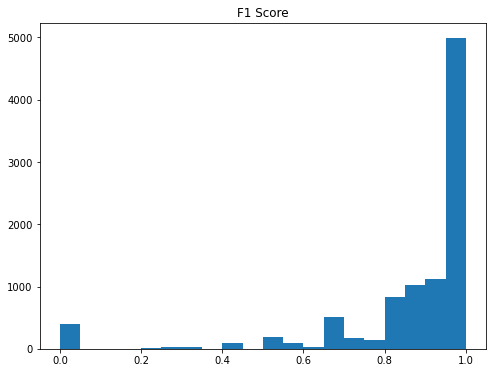

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(f1_by_class, bins=20);
plt.title('F1 Score');

Посмотрим на изображения классов, вызвавшие у модели наиболее серьезные сложности при классификации (одна строка - объекты одного класса):

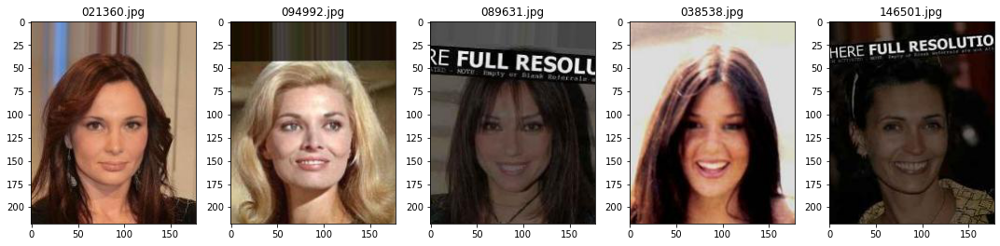

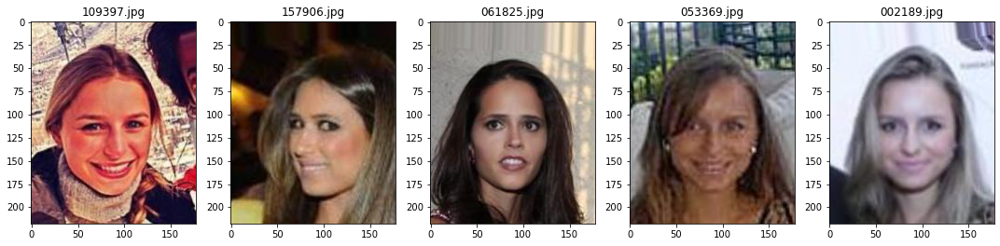

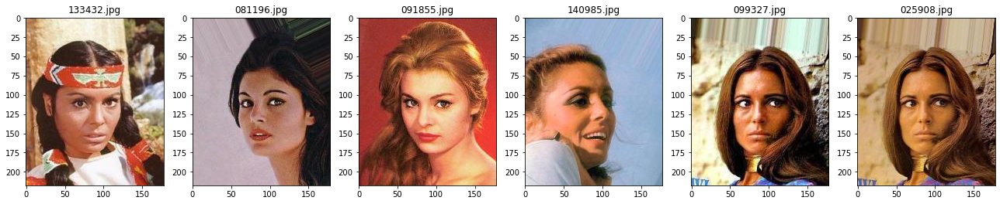

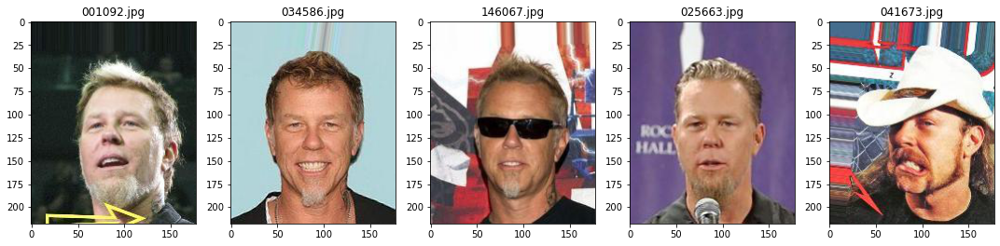

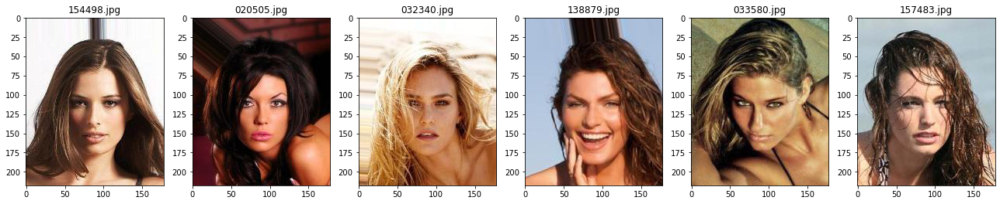

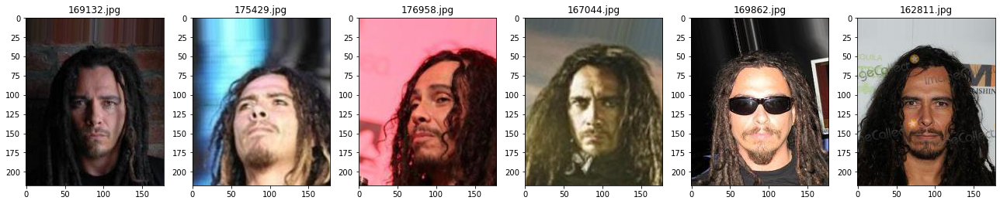

In [ ]:
difficult_classes = [int(key) for key in class_dict if key.isnumeric() 
                         and class_dict[key]['support'] > 4
                         and class_dict[key]['f1-score'] < 0.15]

for class_label in difficult_classes[:6]:
    class_images = [img_test[i] for i in range(len(target_test)) if target_test[i] == class_label]
    class_targets = [target_test[i] for i in range(len(target_test)) if target_test[i] == class_label]
    show_imgs(class_images)

Очевидно, у модели были были основания для затруднений: данные персонажи запечатлены в разные годы, в разных образах, на некоторых изображениях присуствуют посторонние надписи, немало фото в черных очках, с различными стилями прически и т.п.

Посмоторим, как справится с задачей модель ConvNext:

In [ ]:
train_embs_conv, targets_conv, preds_conv = test_emb_model(model_convnext, train_loader_conv, test_loader_conv, to_squeeze=True)

Computing mean train embeddings:   0%|          | 0/2524 [00:00<?, ?it/s]

Inference:   0%|          | 0/631 [00:00<?, ?it/s]

Test Accuracy: 0.708


Как ожидалось, качество ConvNext на 10К классах значительно уступает качеству на 1000 классах: Accuracy 0.708 против 0.852 для этой же модели на 1К классах. Однако, это по-прежнему неплохой показатель для модели, которая обучалась на другом датасете.

In [ ]:
targets_conv = [int(target) for target in targets_conv]

class_dict = classification_report(targets_conv, preds_conv, output_dict=True)
f1_by_class = [class_dict[key]['f1-score'] for key in class_dict if key.isnumeric()]

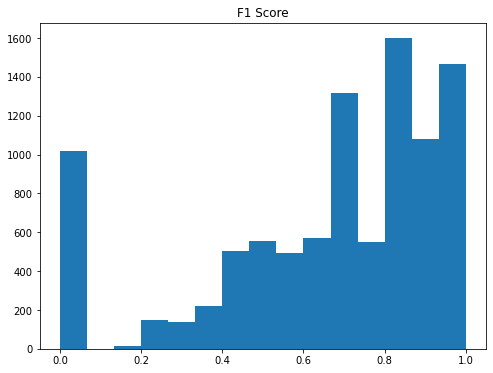

In [ ]:
plt.figure(figsize=(8, 6))
plt.hist(f1_by_class, bins=15);
plt.title('F1 Score');

Видим, что классов, которые оказались сложными для модели, стало значительно больше. Посмотрим на примеры фото из "сложных" классов.

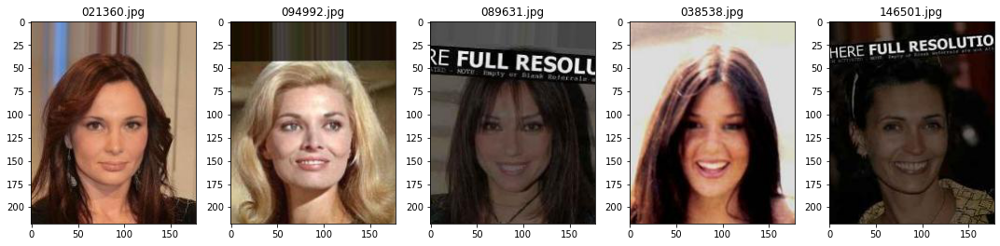

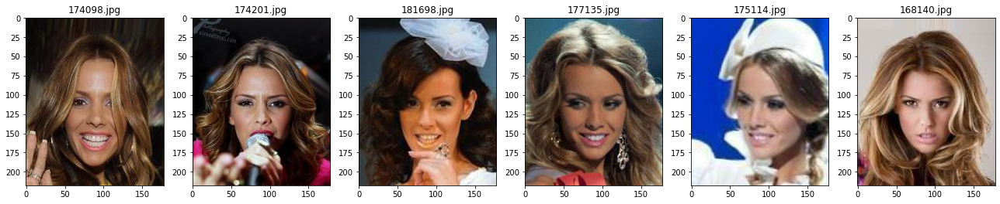

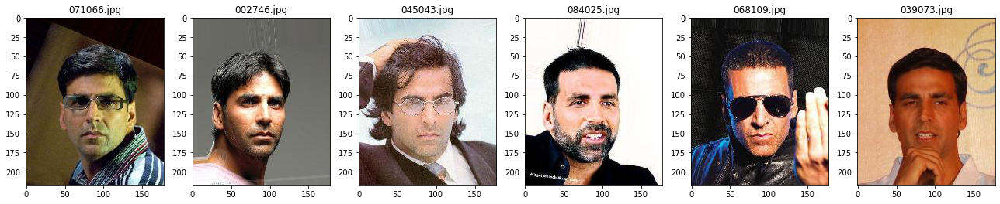

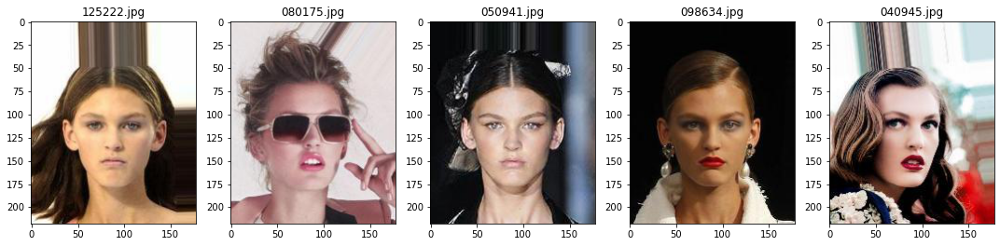

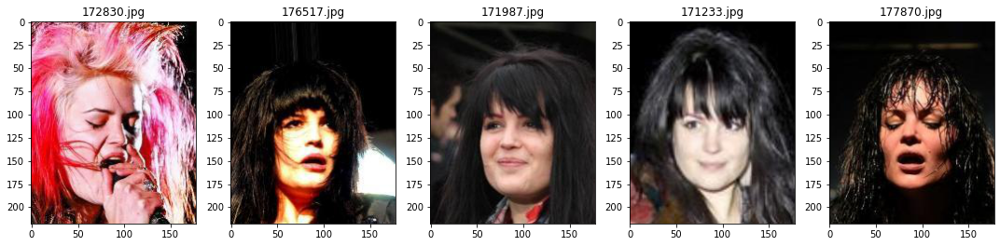

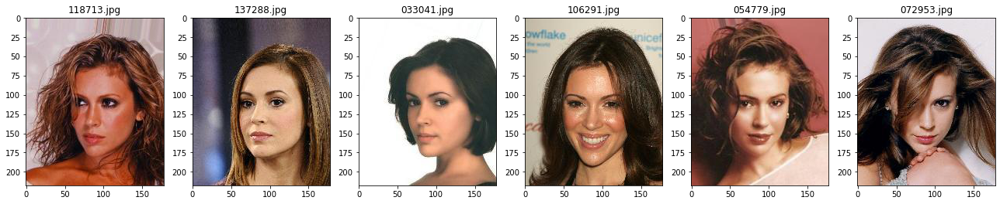

In [ ]:
difficult_classes = [int(key) for key in class_dict if key.isnumeric() 
                         and class_dict[key]['support'] > 4
                         and class_dict[key]['f1-score'] < 0.15]

for class_label in difficult_classes[:6]:
    class_images = [img_test[i] for i in range(len(target_test)) if target_test[i] == class_label]
    class_targets = [target_test[i] for i in range(len(target_test)) if target_test[i] == class_label]
    show_imgs(class_images)

"Сложные" для модели классы частично пересекаются со сложными классами для InceptionResnet, но в целом запутать эту модель путем увеличения разнообразия образов одной и той же модели значительно проще.

Посмотрим на косинусную близость усредненных эмбеддингов для каждого класса:

In [ ]:
cos_sim = cosine_similarity(np.array(train_embs_conv))
cos_sim_conv = cos_sim[np.triu_indices_from(cos_sim, k=1)]

cos_sim = cosine_similarity(np.array(train_embs_ce))
cos_sim_ce = cos_sim[np.triu_indices_from(cos_sim, k=1)]

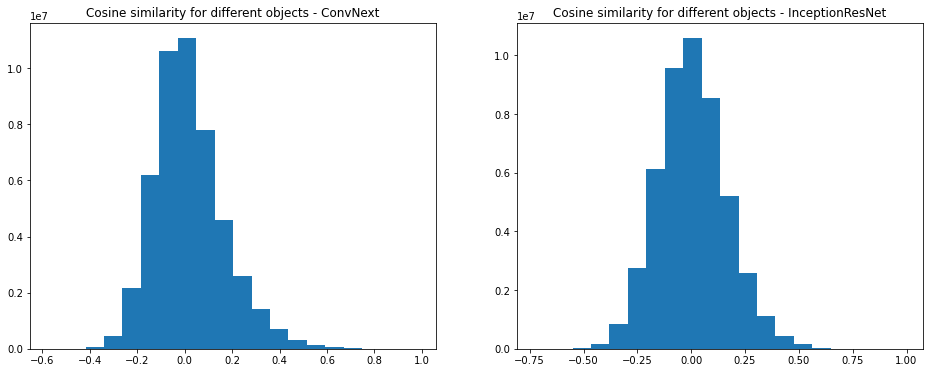

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6));
ax[0].hist(cos_sim_conv, bins=20);
ax[0].set_title('Cosine similarity for different objects - ConvNext');
ax[1].hist(cos_sim_ce, bins=20);
ax[1].set_title('Cosine similarity for different objects - InceptionResNet');


Обе модели неплохо справляются с задачей разделения классов на уровне их эмбеддингов на полном датасете: близость эмбеддингов различных объектов около нуля, дисперсия невелика.<br><br>
Визуализируем представление эмбеддингов 100 случайных объектов:

In [ ]:
N_SAMPLES = 100

person_ids = random.sample(range(0, N_CLASSES), N_SAMPLES)

persons_data = [{'data': train_data[i][0], 'id': target_train[i]} for i in range(len(target_train)) if target_train[i] in person_ids]

len(persons_data)

1619

In [ ]:
model_ce.eval()

for i in tqdm(range(len(persons_data))):
    person_tensor = torch.tensor(persons_data[i]['data']).unsqueeze(0).to(device)
    with torch.no_grad():
        persons_data[i]['emb'] = model_ce(person_tensor).squeeze().cpu().detach().numpy()

  0%|          | 0/1619 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.


In [ ]:
persons_embs = [data['emb'] for data in persons_data]

tsne = TSNE(n_components=2, init='random', learning_rate=200)
persons_embs_transformed = tsne.fit_transform(persons_embs)

for i in range(len(persons_data)):
    persons_data[i]['tsne'] = persons_embs_transformed[i]

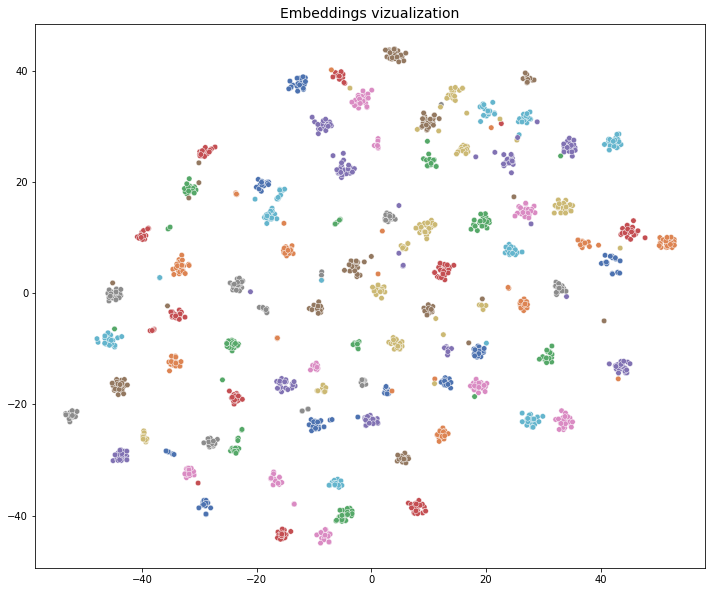

In [ ]:
plt.figure(figsize=(12, 10))
sns.scatterplot(x=[data['tsne'][0] for data in persons_data],
                y=[data['tsne'][1] for data in persons_data],
                hue=[data['id'] for data in persons_data],
                palette='deep',
                s=30);
plt.title('Embeddings vizualization', fontsize=14);
plt.legend().set_visible(False)

Визуализация распределения эмбеддингов также подтверждает неплохую способность модели, обученной на 1000 классах, разделять между собой 10'000 классов.

Наконец, попробуем обучить модель на полном датасете. Модель ConvNext подходит для этого не очень хорошо: одна эпоха обучения займет около часа, при этом потребуется не менее 10-15 эпох. Поэтому обучим на полном датасете модель InceptionResnetПри, при обучении используем ArcFace Loss.

In [ ]:
img_train_set, img_test_set, target_train_set, target_test_set = train_test_split(
                            images,
                            list(map(lambda x: target_to_idx[x], targets)),
                            test_size=0.3,
                            random_state=SEED, shuffle=True, stratify=targets)

img_val_set, img_test_set, target_val_set, target_test_set = train_test_split(
                            img_test_set,
                            target_test_set,
                            test_size=0.5,
                            random_state=SEED, shuffle=True)

In [ ]:
len(img_train_set), len(img_val_set), len(img_test_set)

(141334, 30286, 30287)

In [ ]:
IMAGE_SIZE = 160
EMB_SIZE = 512
N_CLASSES = len(set(map(lambda x: target_to_idx[x], targets)))

CROP_PARAMS = {'top':75,
               'left': 34,
               'height': 110,
               'width': 110}

transform = [
                    transforms.Resize(IMAGE_SIZE),                                           
                    transforms.ToTensor(),
                    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
            ]

augmentation = [transforms.RandomHorizontalFlip()]

In [ ]:
BATCH_SIZE = 32

train_data_set = celebA_Full_Dataset(img_train_set, target_train_set, transform + augmentation)
val_data_set = celebA_Full_Dataset(img_val_set, target_val_set, transform)
test_data_set = celebA_Full_Dataset(img_test_set, target_test_set, transform)

train_loader = torch.utils.data.DataLoader(train_data_set, batch_size=BATCH_SIZE, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_data_set, batch_size=BATCH_SIZE, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_data_set, batch_size=BATCH_SIZE, shuffle=False)

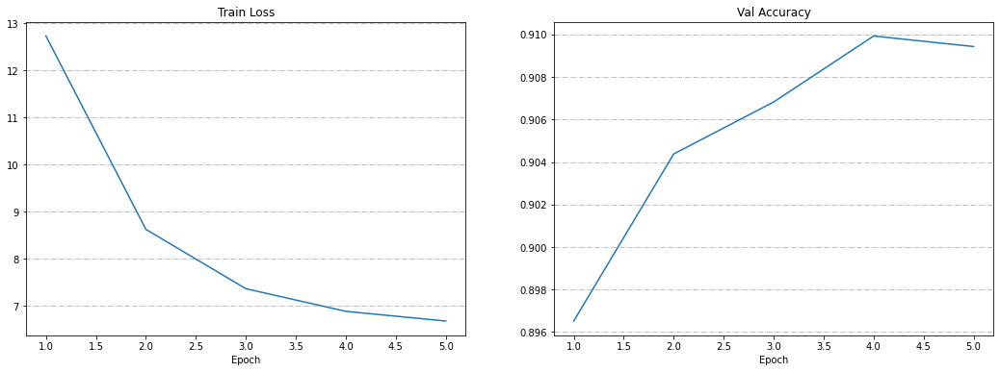

Epoch 5 	Train Loss: 6.681 	Accuracy: 0.909


In [ ]:
torch.cuda.empty_cache()

model = InceptionResnetV1(pretrained='vggface2', classify=True, num_classes=N_CLASSES)

layers_to_unfreeze = 10

for param in list(model.parameters())[:-layers_to_unfreeze]:
    param.requires_grad = False

model.logits = nn.Identity()    

model = model.to(device)

optimizer = torch.optim.Adam(params=[
        {"params": list(model.parameters())[-layers_to_unfreeze:]},
        {"params": list(model.parameters())[:-layers_to_unfreeze], "lr": 2e-5}
    ], 
    lr=2e-4)

criterion = nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.3)
arcface = AddMarginProduct(EMB_SIZE, N_CLASSES, s=20, m=0.4).to(device)

N_EPOCHS = 5
ARCFACE_LR = 1e-4

model_training_info = train_arcface(model, optimizer, criterion, arcface, None, N_EPOCHS, ARCFACE_LR)

In [ ]:
test_arcface(model)

Computing mean train embeddings:   0%|          | 0/4417 [00:00<?, ?it/s]

Inference:   0%|          | 0/947 [00:00<?, ?it/s]

Test Accuracy: 0.911


Итак, при обучении на полном датасете удалось поднять Accuracy модели до 0.91 по сравнению с 0.90 для модели, обучавшейся на детесете с 1000 классами.